In [1]:
from dataloader import DataLoader
loader = DataLoader()

_initialize_data took 63.8495 seconds


In [3]:
df = loader.get_data(hs_code=280130)

### Export/Import Analysis

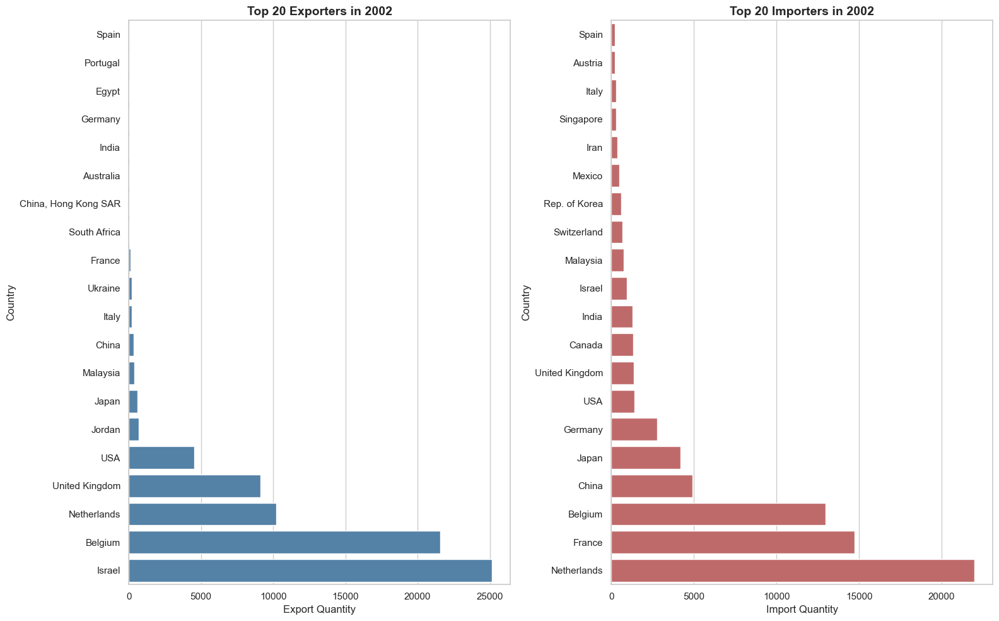

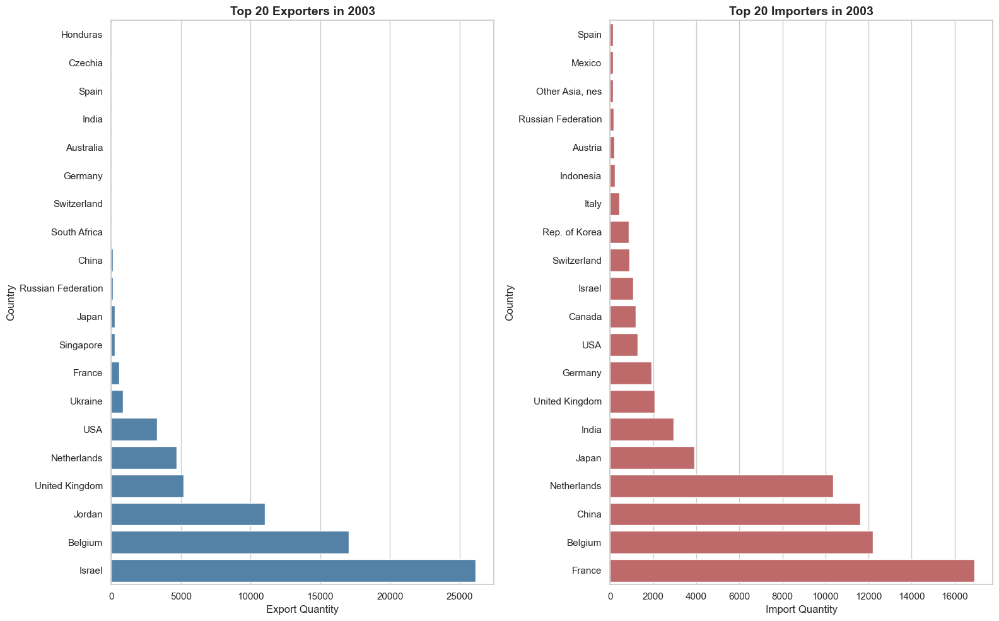

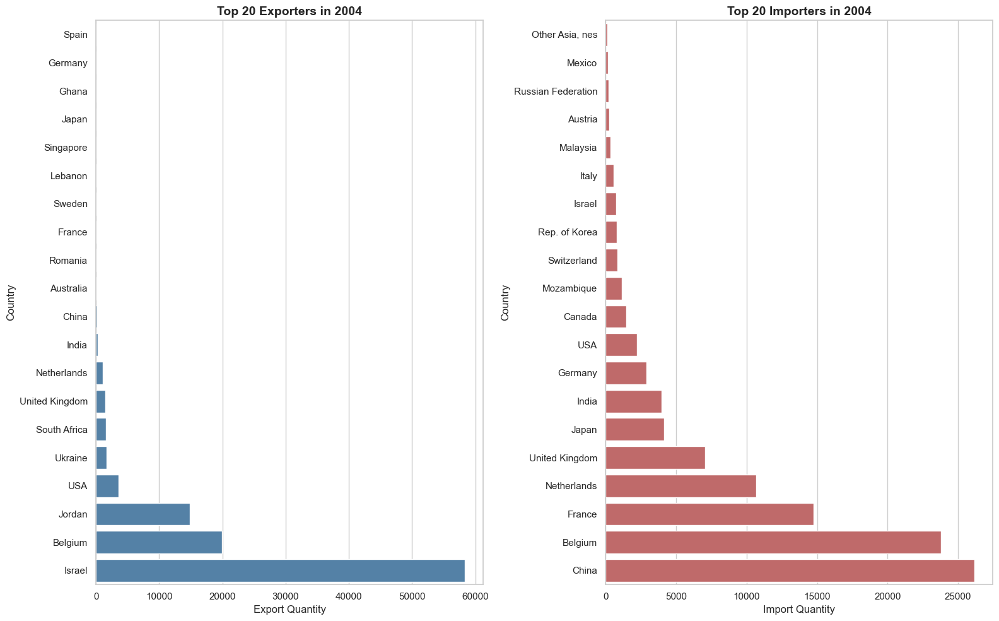

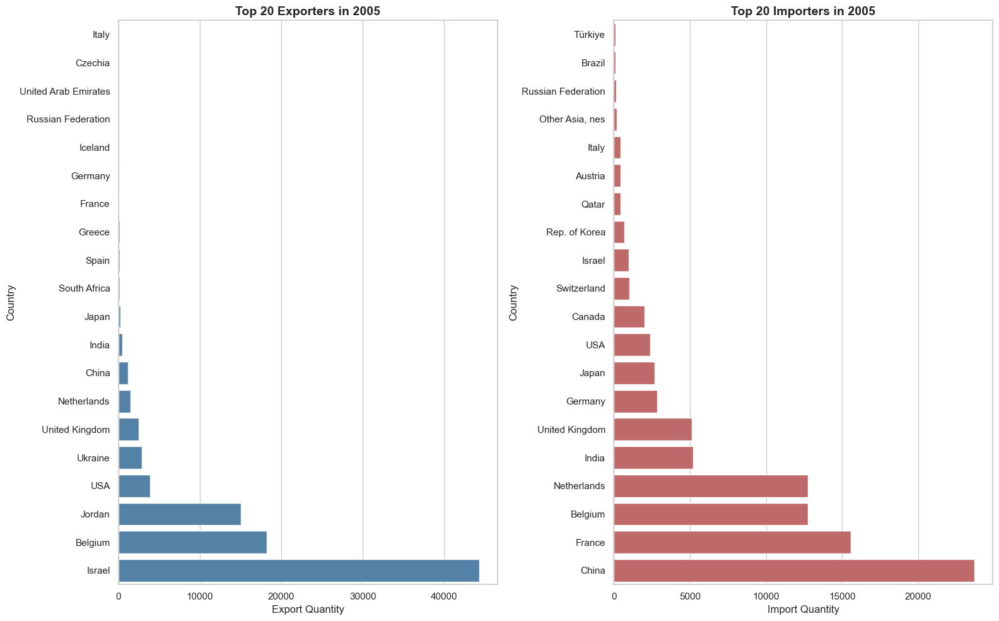

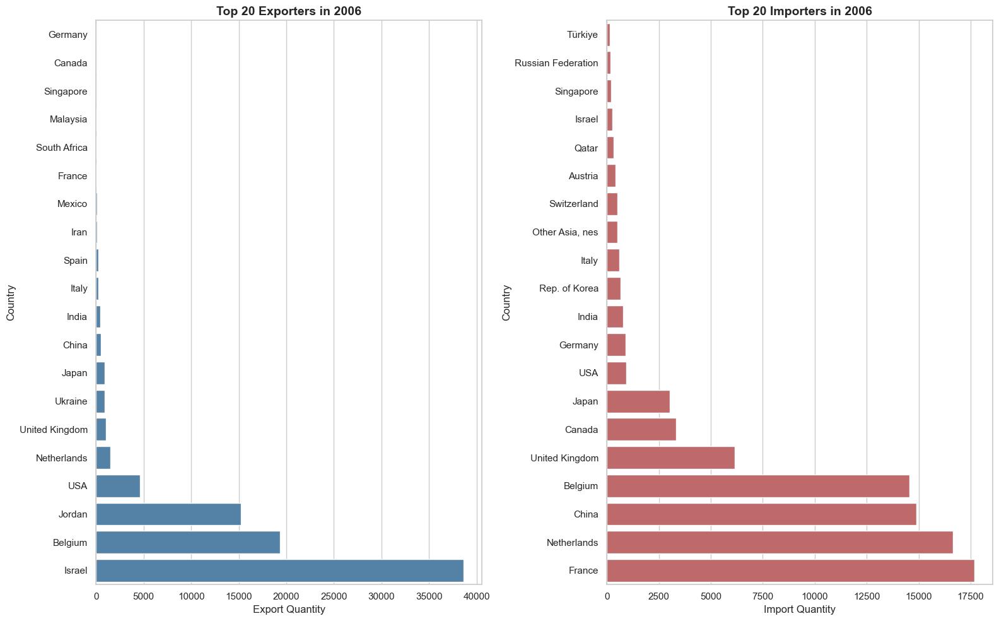

...

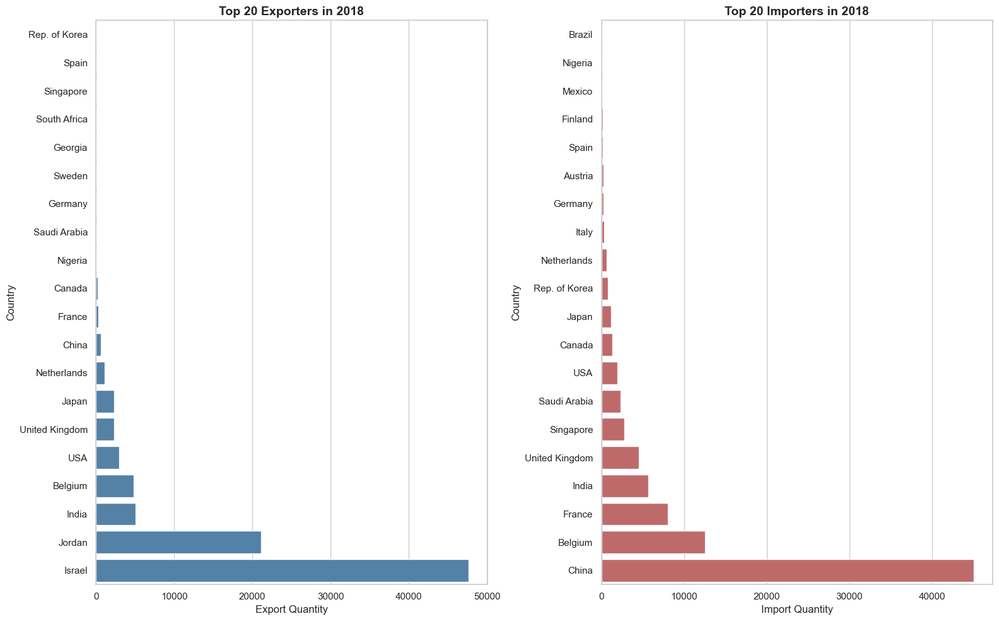

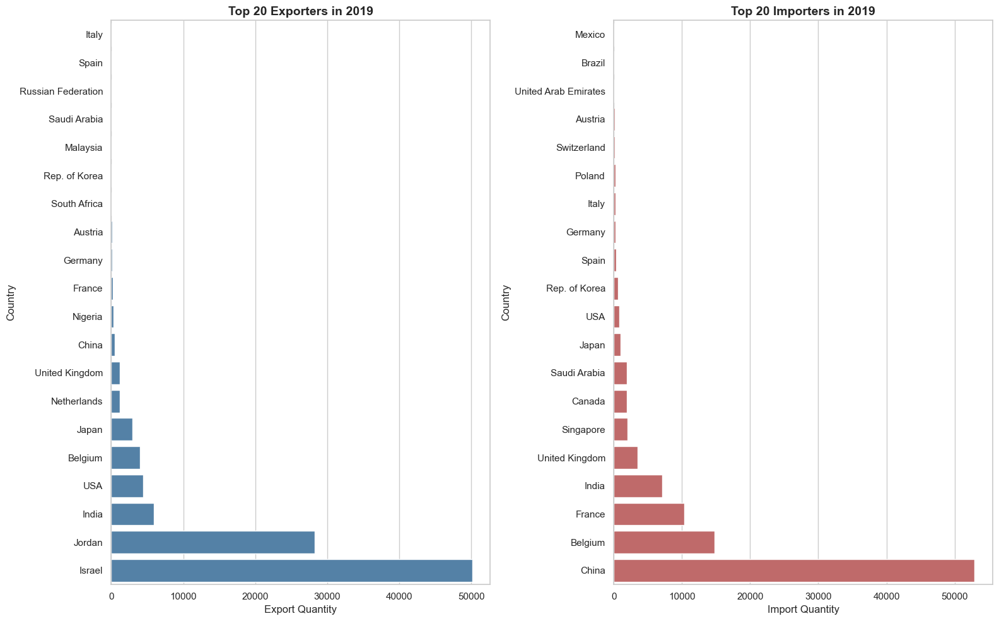

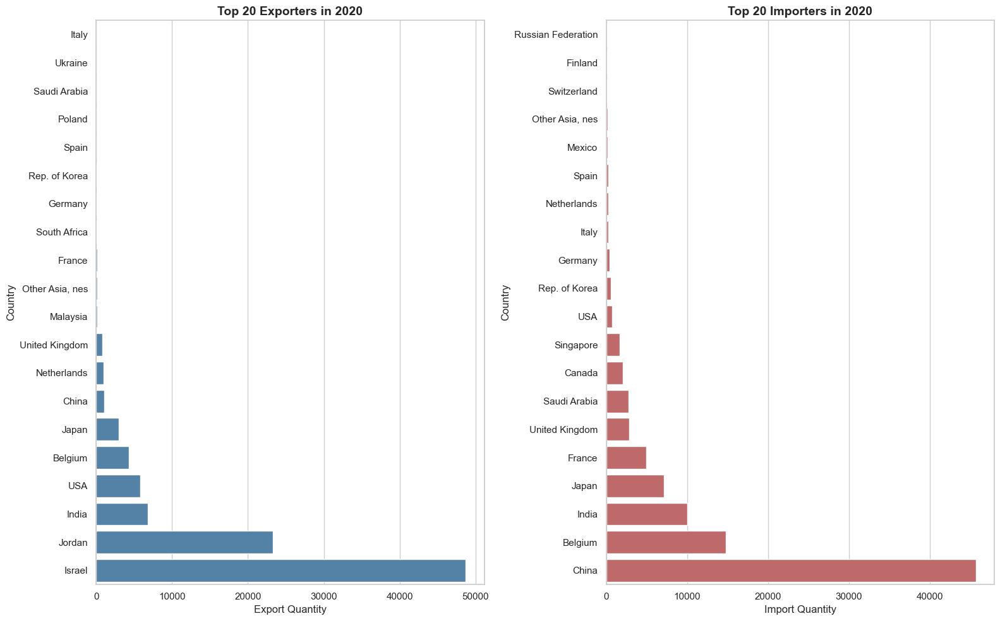

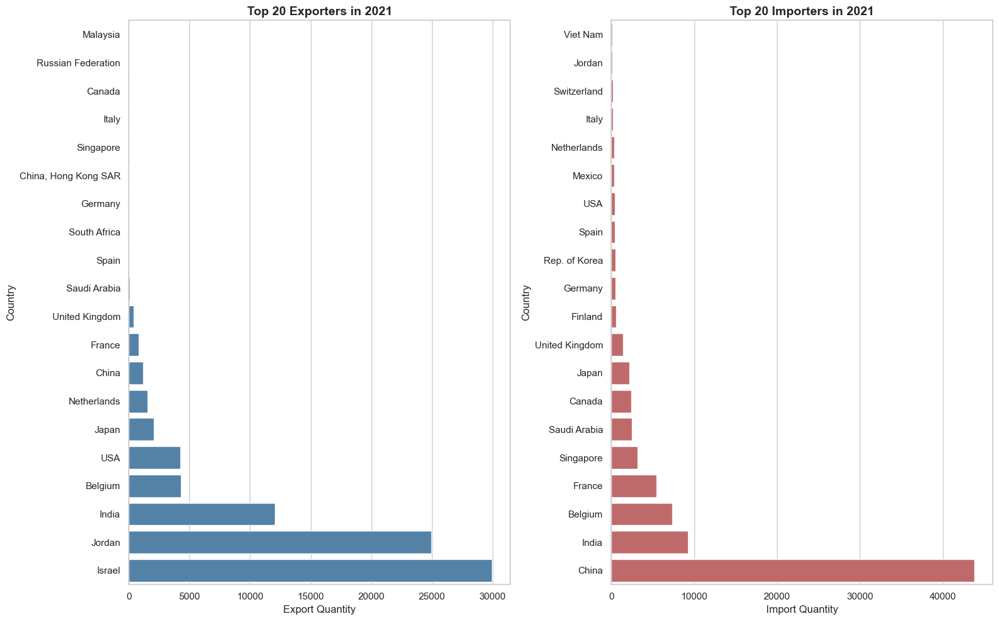

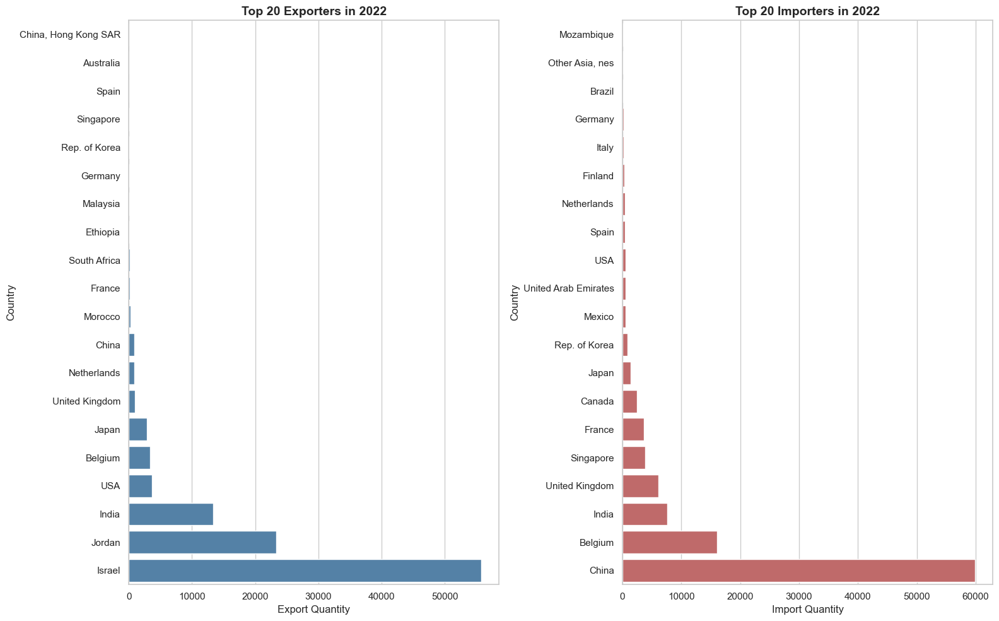

In [4]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

###################################################
# Data Selection
###################################################
df_fluorine = df.filter(pl.col("k") == 280130).to_pandas()
df_fluorine['t'] = df_fluorine['t'].astype(int)
years = sorted(df_fluorine['t'].unique())
top_n = 20

###################################################
# Visualization over Time
###################################################
sns.set_theme(style="whitegrid")

for y in years:
    df_year = df_fluorine[df_fluorine['t'] == y]

    # Aggregation by Exporter
    exports = df_year.groupby("export_country")['q'].sum().reset_index()
    exports = exports.sort_values('q', ascending=False).head(top_n)

    # Aggregation by Importer
    imports = df_year.groupby("import_country")['q'].sum().reset_index()
    imports = imports.sort_values('q', ascending=False).head(top_n)

    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    
    # Visualization of Exporters
    exports = exports.sort_values('q')
    sns.barplot(x='q', y='export_country', data=exports, ax=axs[0], color='steelblue')
    axs[0].set_title(f"Top {top_n} Exporters in {y}", fontsize=14, fontweight='bold')
    axs[0].set_xlabel("Export Quantity")
    axs[0].set_ylabel("Country")
    
    # Visualization of Importers
    imports = imports.sort_values('q')
    sns.barplot(x='q', y='import_country', data=imports, ax=axs[1], color='indianred')
    axs[1].set_title(f"Top {top_n} Importers in {y}", fontsize=14, fontweight='bold')
    axs[1].set_xlabel("Import Quantity")
    axs[1].set_ylabel("Country")

    plt.tight_layout()
    plt.show()


## Graph Machine Learning

In [12]:
import polars as pl
import numpy as np
import pandas as pd
import torch
from torch import nn
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv, GAE
import torch.nn.functional as F
import networkx as nx
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

###################################################
# Parameters
###################################################
product_code = 280130
start_year = 2005
end_year = 2022
window_size = 3
epochs = 50
lr = 0.01
embedding_dim = 32
hidden_dim = 64

# DEVICE
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

###################################################
# Load and Filter Data
###################################################
df_fluorine = df.filter(pl.col("k") == product_code)

all_years = sorted(df_fluorine.select(pl.col("t")).unique().to_series().to_list())
years_of_interest = [y for y in all_years if start_year <= y <= end_year]

if len(years_of_interest) < 2:
    raise ValueError("Not enough years of data for temporal analysis.")

pdf_fluorine = df_fluorine.to_pandas()
all_countries = np.union1d(pdf_fluorine['export_country'].unique(), pdf_fluorine['import_country'].unique())
country_to_id = {c: i for i, c in enumerate(all_countries)}
num_nodes = len(all_countries)

Using device: cpu


In [13]:
###################################################
# Node Feature Builder
###################################################
def build_node_features_for_year(year_data, all_countries):
    # If GDP features not available, use zero features
    if 'gdpcap_o' not in year_data.columns or 'gdpcap_d' not in year_data.columns:
        node_features = np.zeros((len(all_countries), 2))
        return torch.tensor(node_features, dtype=torch.float)

    export_gdp = year_data.groupby("export_country")["gdpcap_d"].mean().to_dict()
    import_gdp = year_data.groupby("import_country")["gdpcap_o"].mean().to_dict()

    node_features = []
    for c in all_countries:
        gdp_o_val = import_gdp.get(c, 0.0)
        gdp_d_val = export_gdp.get(c, 0.0)
        node_features.append([gdp_o_val, gdp_d_val])
    return torch.tensor(node_features, dtype=torch.float)

In [14]:
###################################################
# Graph Snapshots for each Year
###################################################
edge_feature_cols = ["v"]
scaler = StandardScaler()
all_edge_attrs = pdf_fluorine[edge_feature_cols].fillna(0.0)
scaler.fit(all_edge_attrs)

def build_graph_for_year(year):
    year_pdf = pdf_fluorine[pdf_fluorine['t'] == year]
    if year_pdf.empty:
        return Data(x=torch.zeros((num_nodes,2)), edge_index=torch.empty((2,0), dtype=torch.long))

    x = build_node_features_for_year(year_pdf, all_countries)
    src = year_pdf['export_country'].map(country_to_id)
    dst = year_pdf['import_country'].map(country_to_id)
    edge_index = torch.tensor([src.values, dst.values], dtype=torch.long)

    attrs = year_pdf[edge_feature_cols].fillna(0.0).values
    attrs = scaler.transform(attrs)
    edge_attr = torch.tensor(attrs, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data

year_graphs = []
for y in years_of_interest:
    data_y = build_graph_for_year(y)
    year_graphs.append((y, data_y))

In [15]:
###################################################
# GCN Encoder
###################################################
class GCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

In [16]:
###################################################
# Training for Yearly Embeddings
###################################################
year_embeddings = {}

for y, data_y in year_graphs:
    data_y = data_y.to(device)
    encoder = GCNEncoder(in_channels=data_y.x.size(1),
                         hidden_channels=hidden_dim,
                         out_channels=embedding_dim)
    model = GAE(encoder=encoder).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    rev_edge_index = torch.stack([data_y.edge_index[1], data_y.edge_index[0]], dim=0)
    full_edge_index = torch.cat([data_y.edge_index, rev_edge_index], dim=1)
    data_y.edge_index = full_edge_index

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        z = model.encode(data_y.x, data_y.edge_index)
        loss = model.recon_loss(z, data_y.edge_index)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        z = model.encode(data_y.x, data_y.edge_index)
    year_embeddings[y] = z.cpu().numpy()

In [17]:
###################################################
# Sliding Window Analysis of Network Structure
###################################################
def build_nx_graph_from_edges(edge_index):
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for j in range(edge_index.size(1)):
        u = edge_index[0, j].item()
        v = edge_index[1, j].item()
        G.add_edge(u, v)
    return G

window_metrics = []
for i in range(len(years_of_interest) - window_size + 1):
    window_years = years_of_interest[i:i+window_size]
    combined_edge_index = []
    for wy in window_years:
        idx = years_of_interest.index(wy)
        ei = year_graphs[idx][1].edge_index
        combined_edge_index.append(ei)
    combined_edge_index = torch.cat(combined_edge_index, dim=1)
    
    combined_edge_index = torch.unique(combined_edge_index, dim=1)
    
    G_window = build_nx_graph_from_edges(combined_edge_index)
    
    deg_centrality = nx.degree_centrality(G_window)
    bet_centrality = nx.betweenness_centrality(G_window)
    communities = nx.algorithms.community.greedy_modularity_communities(G_window)
    num_communities = len(communities)
    
    window_metrics.append({
        'start_year': window_years[0],
        'end_year': window_years[-1],
        'avg_degree_centrality': np.mean(list(deg_centrality.values())),
        'avg_betweenness_centrality': np.mean(list(bet_centrality.values())),
        'num_communities': num_communities
    })

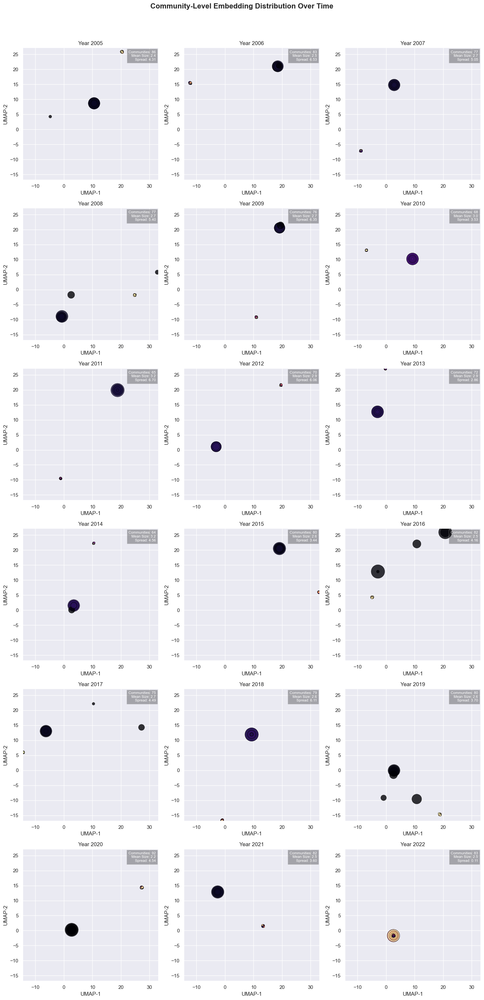

In [18]:
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from sklearn.preprocessing import StandardScaler
import umap.umap_ as umap
from scipy.stats import gaussian_kde

num_nodes = len(all_countries)
embedding_dim = list(year_embeddings.values())[0].shape[1]

###################################################
# 1. Community Aggregation by Year
###################################################
def get_communities_for_year(data_y):
    G_y = nx.Graph()
    G_y.add_nodes_from(range(num_nodes))
    for j in range(data_y.edge_index.size(1)):
        u = data_y.edge_index[0, j].item()
        v = data_y.edge_index[1, j].item()
        G_y.add_edge(u, v)
    communities = nx.algorithms.community.greedy_modularity_communities(G_y)
    return communities

year_communities = {}
for y, data_y in year_graphs:
    year_communities[y] = get_communities_for_year(data_y)

###################################################
# Community-Level Embeddings
###################################################
year_comm_embeddings = {}
year_comm_sizes = {}
for y in years_of_interest:
    emb = year_embeddings[y]
    comms = year_communities[y]

    comm_embs = []
    comm_sizes = []
    for cset in comms:
        c_indices = list(cset)
        c_emb = emb[c_indices].mean(axis=0)
        comm_embs.append(c_emb)
        comm_sizes.append(len(c_indices))
    comm_embs = np.array(comm_embs)
    year_comm_embeddings[y] = comm_embs
    year_comm_sizes[y] = np.array(comm_sizes)

all_comm_embeddings = []
comm_labels = []
for y in years_of_interest:
    cemb = year_comm_embeddings[y]
    for i in range(cemb.shape[0]):
        all_comm_embeddings.append(cemb[i])
        comm_labels.append((y, i))

all_comm_embeddings = np.vstack(all_comm_embeddings)
reducer = umap.UMAP(n_neighbors=10, min_dist=0.1, random_state=42)
all_comm_2d = reducer.fit_transform(all_comm_embeddings)

x_min, x_max = all_comm_2d[:,0].min(), all_comm_2d[:,0].max()
y_min, y_max = all_comm_2d[:,1].min(), all_comm_2d[:,1].max()

cols = 3
rows = math.ceil(len(years_of_interest)/cols)
fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
axs = axs.flatten()

###################################################
# Plot Years Arranged in a Grid
###################################################
for idx, y in enumerate(years_of_interest):
    year_indices = [i for i, (yr, _) in enumerate(comm_labels) if yr == y]
    year_embs_2d = all_comm_2d[year_indices]
    x = year_embs_2d[:,0]
    yy = year_embs_2d[:,1]

    xy = np.vstack([x, yy])
    z = gaussian_kde(xy)(xy)
    
    comm_sizes = year_comm_sizes[y]
    size_scaled = 50 * (comm_sizes / comm_sizes.mean())

    ax = axs[idx]
    sc = ax.scatter(x, yy, c=z, cmap='magma', s=size_scaled, alpha=0.8, edgecolors='black', linewidths=0.5)
    ax.set_title(f"Year {y}", fontsize=12)

    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel("UMAP-1")
    ax.set_ylabel("UMAP-2")

    n_comms = len(comm_sizes)
    mean_size = comm_sizes.mean()
    spread = np.sqrt((x.var() + yy.var())/2.0)

    summary_text = (f"Communities: {n_comms}\n"
                    f"Mean Size: {mean_size:.1f}\n"
                    f"Spread: {spread:.2f}")
    ax.text(0.98, 0.98, summary_text, transform=ax.transAxes, 
            va='top', ha='right', fontsize=8,
            bbox=dict(facecolor='black', alpha=0.3, pad=4),
            color='white')

for i in range(len(years_of_interest), len(axs)):
    fig.delaxes(axs[i])

fig.suptitle("Community-Level Embedding Distribution Over Time", fontsize=16, y=1.02, fontweight="bold")
plt.tight_layout()
plt.show()



posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

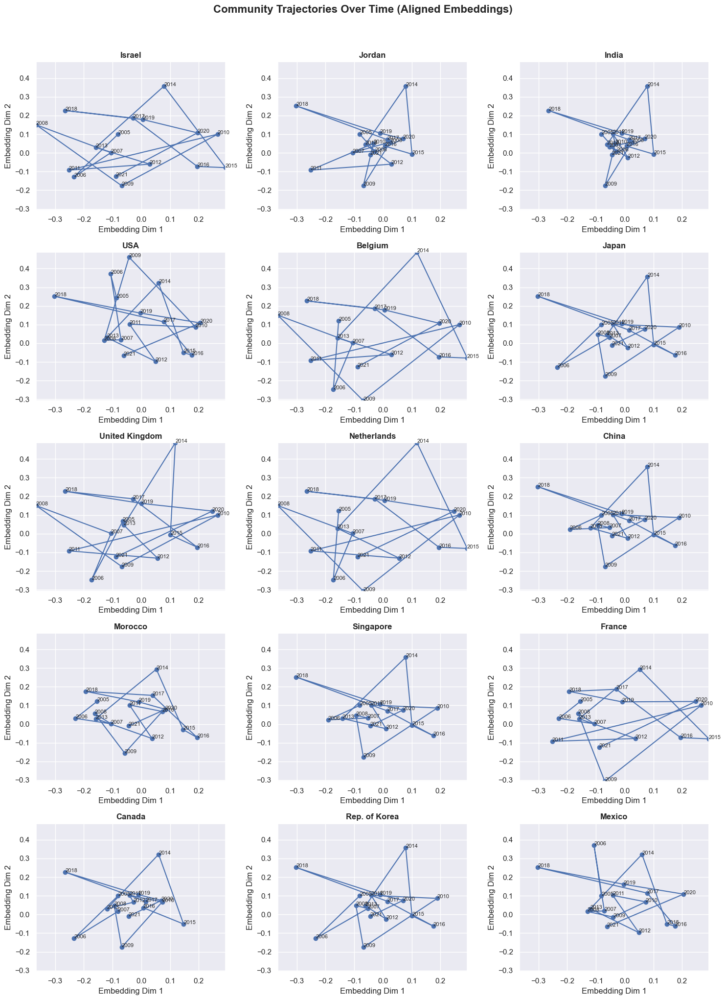

In [31]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GAE
import numpy as np
import pandas as pd
import networkx as nx
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

num_nodes = len(all_countries)
embedding_dim = 32
hidden_dim = 64
epochs = 50
lr = 0.01

def build_graph_for_year(year):
    year_pdf = pdf_fluorine[pdf_fluorine['t'] == year]
    if year_pdf.empty:
        data = Data(x=torch.zeros((num_nodes, 2)), edge_index=torch.empty((2,0), dtype=torch.long))
        return data

    x = build_node_features_for_year(year_pdf, all_countries)
    src = year_pdf['export_country'].map(country_to_id)
    dst = year_pdf['import_country'].map(country_to_id)
    edge_index = torch.tensor([src.values, dst.values], dtype=torch.long)

    attrs = year_pdf[edge_feature_cols].fillna(0.0).values
    attrs = scaler.transform(attrs)
    edge_attr = torch.tensor(attrs, dtype=torch.float)

    data = Data(x=x, edge_index=edge_index, edge_attr=edge_attr)
    return data

year_graphs = []
for y in years_of_interest:
    year_graphs.append((y, build_graph_for_year(y)))

##############################################
# GCN Encoder for GAE
##############################################
class GCNEncoder(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return x

##############################################
# Training
##############################################
year_embeddings = {}
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Couldn't make mps work here for some reason

for y, data_y in year_graphs:
    data_y = data_y.to(device)

    encoder = GCNEncoder(in_channels=data_y.x.size(1), hidden_channels=hidden_dim, out_channels=embedding_dim)
    model = GAE(encoder=encoder).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    rev_edge_index = torch.stack([data_y.edge_index[1], data_y.edge_index[0]], dim=0)
    full_edge_index = torch.cat([data_y.edge_index, rev_edge_index], dim=1)
    data_y.edge_index = full_edge_index

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        z = model.encode(data_y.x, data_y.edge_index)
        loss = model.recon_loss(z, data_y.edge_index)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        z = model.encode(data_y.x, data_y.edge_index)
    year_embeddings[y] = z.cpu().numpy()

##############################################
# Alignment of Embeddings over Time
##############################################
def align_embeddings(ref_emb, target_emb):
    ref_mean = ref_emb.mean(axis=0, keepdims=True)
    tgt_mean = target_emb.mean(axis=0, keepdims=True)
    ref_centered = ref_emb - ref_mean
    tgt_centered = target_emb - tgt_mean
    U, S, Vt = np.linalg.svd(ref_centered.T @ tgt_centered)
    R = U @ Vt
    aligned = (tgt_centered @ R)
    aligned *= (np.linalg.norm(ref_centered) / np.linalg.norm(aligned))
    aligned += ref_mean
    return aligned

ref_year = years_of_interest[0]
ref_emb = year_embeddings[ref_year]
for y in years_of_interest[1:]:
    year_embeddings[y] = align_embeddings(ref_emb, year_embeddings[y])

##############################################
# Community Detection and Tracking
##############################################
year_communities = {}
for y, data_y in year_graphs:
    ei = data_y.edge_index.cpu().numpy() if data_y.edge_index.numel() > 0 else np.empty((2,0),dtype=int)
    G = nx.Graph()
    G.add_nodes_from(range(num_nodes))
    for j in range(ei.shape[1]):
        G.add_edge(ei[0,j], ei[1,j])
    comms = nx.algorithms.community.greedy_modularity_communities(G)
    year_communities[y] = comms

def find_community_for_country(comms, cid):
    for i, cset in enumerate(comms):
        if cid in cset:
            return i
    return None

##############################################
# Visualization of Country Trajectory
##############################################
key_countries = [
    "Israel",
    "Jordan",
    "India",
    "USA",
    "Belgium",
    "Japan",
    "United Kingdom",
    "Netherlands",
    "China",
    "Morocco",
    "Singapore",
    "France",
    "Canada",
    "Rep. of Korea",
    "Mexico"
]

country_ids = {c: country_to_id[c] for c in key_countries if c in country_to_id}

country_trajectories = {}
all_coords = []

for ctry, cid in country_ids.items():
    community_positions_over_time = []
    for y in years_of_interest:
        comms = year_communities[y]
        c_idx = find_community_for_country(comms, cid)
        if c_idx is not None:
            emb = year_embeddings[y]
            c_indices = list(comms[c_idx])
            c_position = emb[c_indices].mean(axis=0)
            community_positions_over_time.append((y, c_position))
    country_trajectories[ctry] = community_positions_over_time

    if len(community_positions_over_time) > 0:
        _, coords = zip(*community_positions_over_time)
        coords = np.array(coords)
        all_coords.append(coords)

if len(all_coords) > 0:
    all_coords_stacked = np.vstack(all_coords)
    x_min = np.nanmin(all_coords_stacked[:,0])
    x_max = np.nanmax(all_coords_stacked[:,0])
    y_min = np.nanmin(all_coords_stacked[:,1])
    y_max = np.nanmax(all_coords_stacked[:,1])
    
else:
    x_min, x_max, y_min, y_max = -1, 1, -1, 1

num_countries = len(country_trajectories)
cols = 3
rows = (num_countries + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axs = axs.flatten()

for i, (ctry, traj) in enumerate(country_trajectories.items()):
    ax = axs[i]
    if len(traj) > 0:
        ys, coords = zip(*traj)
        coords = np.array(coords)
        ax.plot(coords[:,0], coords[:,1], marker='o')
        for j, yy in enumerate(ys):
            ax.text(coords[j,0], coords[j,1], str(yy), fontsize=8)

        ax.set_title(f"{ctry}", fontweight="bold")
        ax.set_xlabel("Embedding Dim 1")
        ax.set_ylabel("Embedding Dim 2")
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
    else:
        ax.text(0.5,0.5,"No Data",ha='center',va='center',fontsize=10)
        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xlabel("Embedding Dim 1")
        ax.set_ylabel("Embedding Dim 2")

for k in range(num_countries, rows*cols):
    fig.delaxes(axs[k])

fig.suptitle("Community Trajectories Over Time (Aligned Embeddings)", fontsize=16, y=1.02, fontweight="bold")
plt.tight_layout()
plt.show()

## Attack Simulation

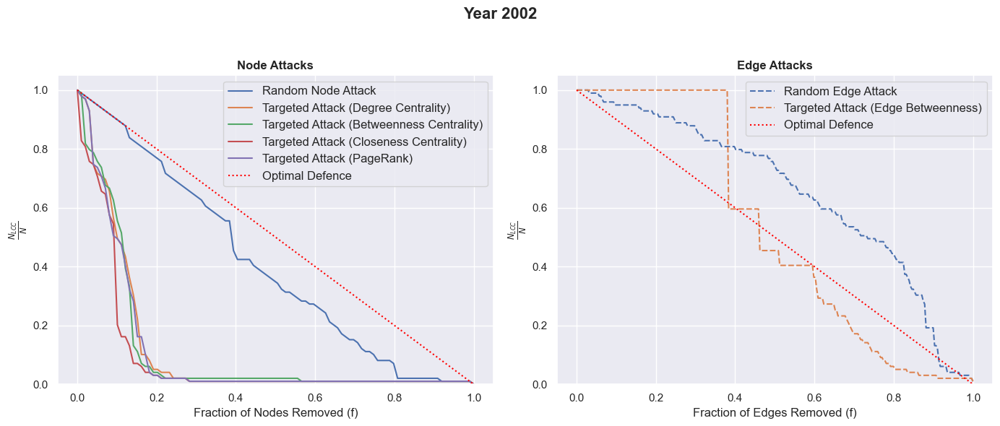

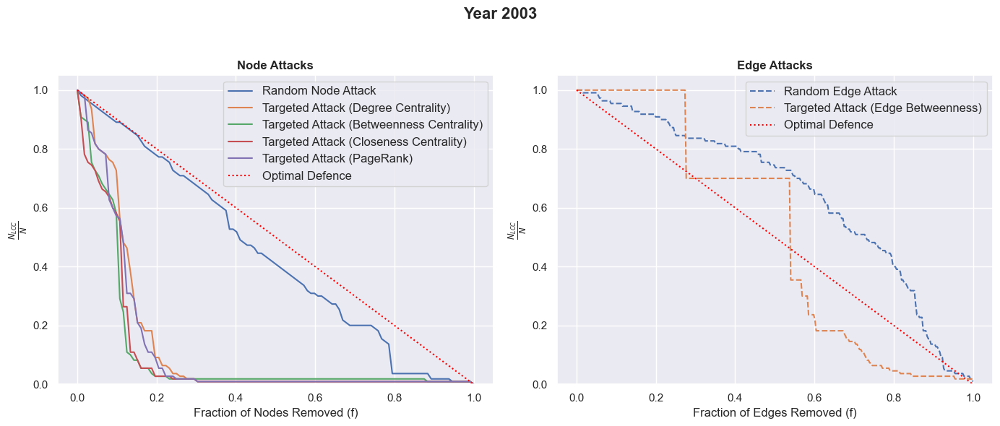

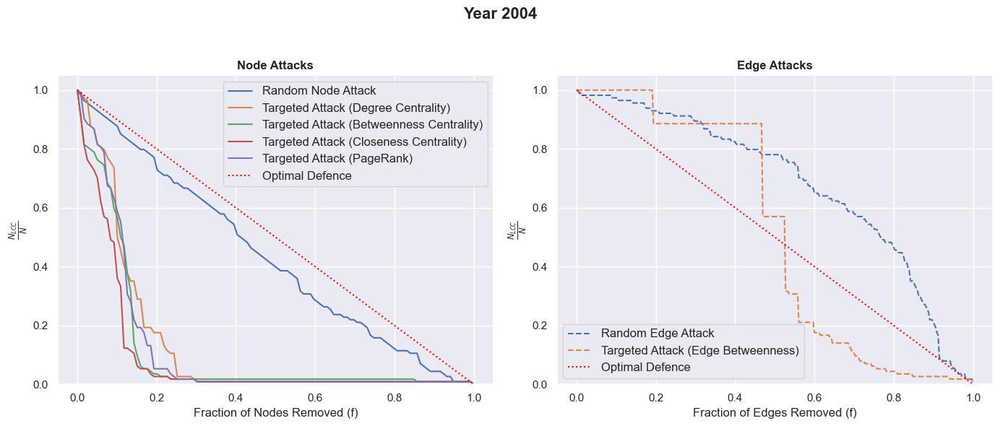

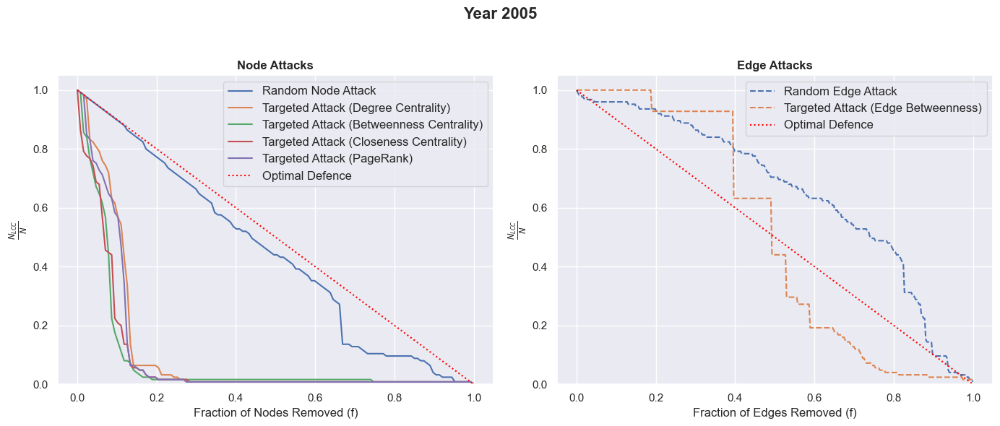

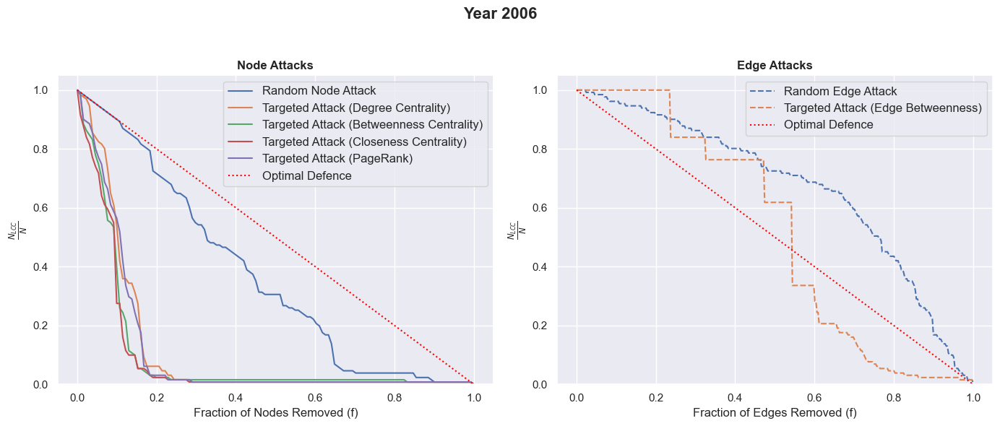

...

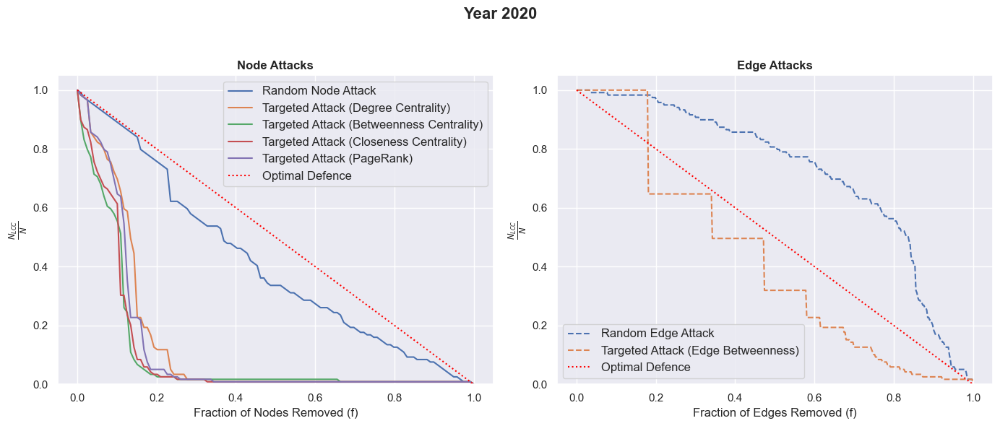

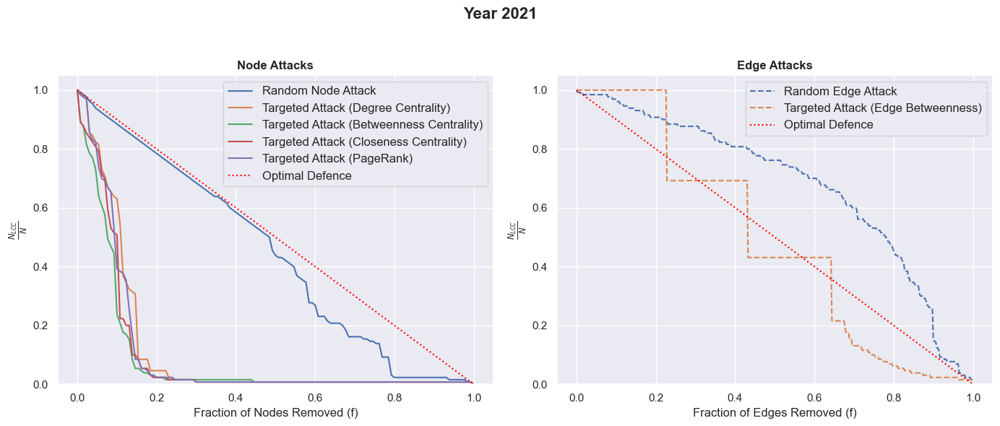

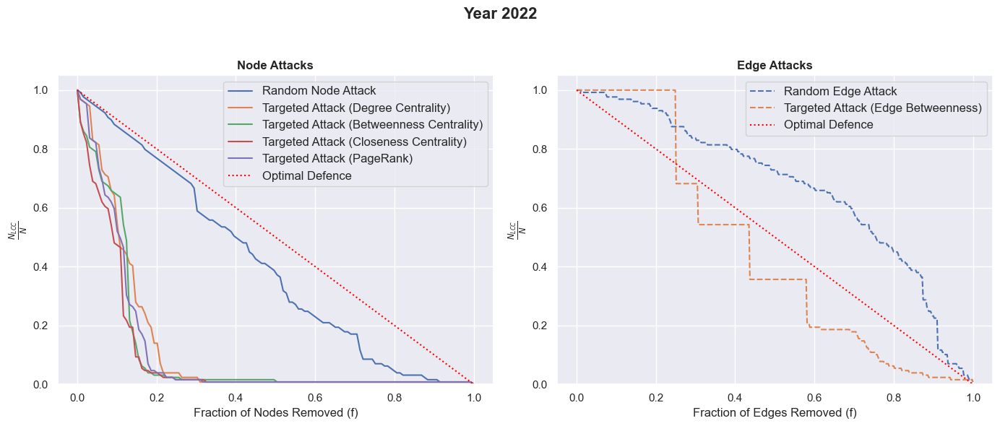

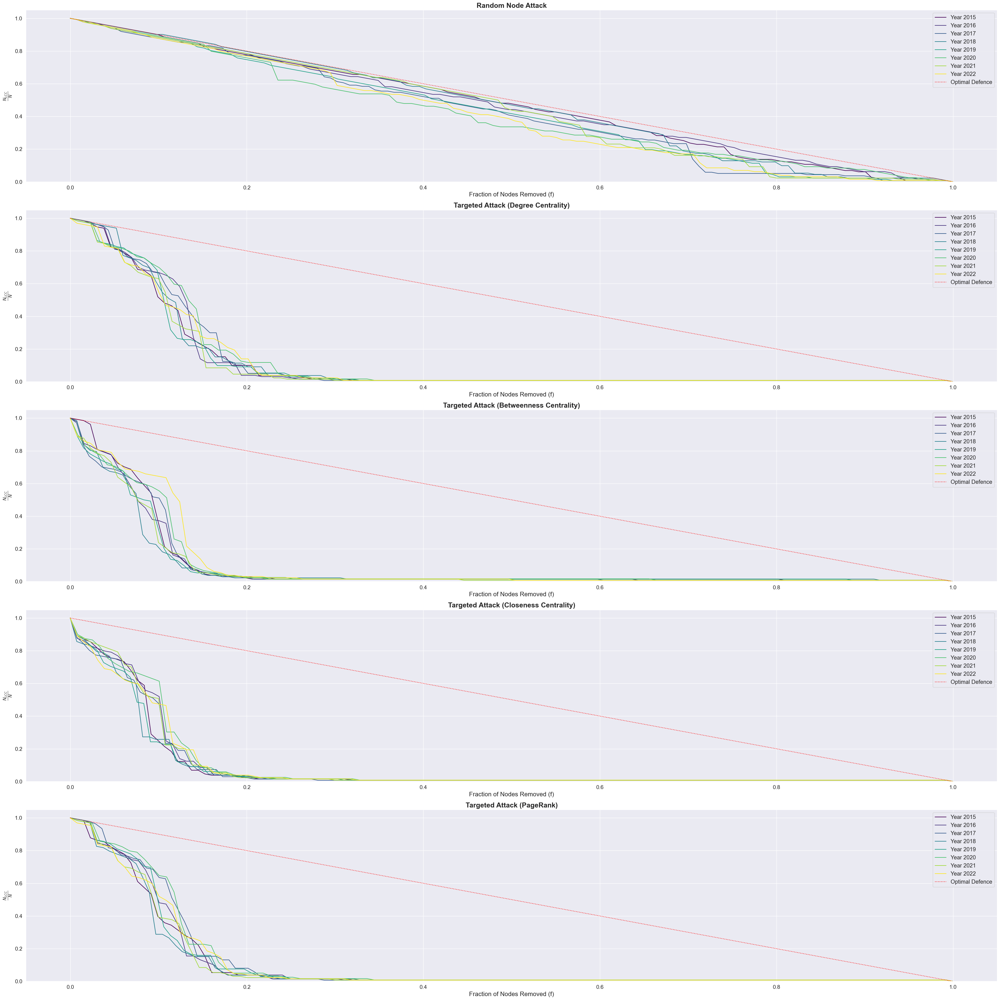

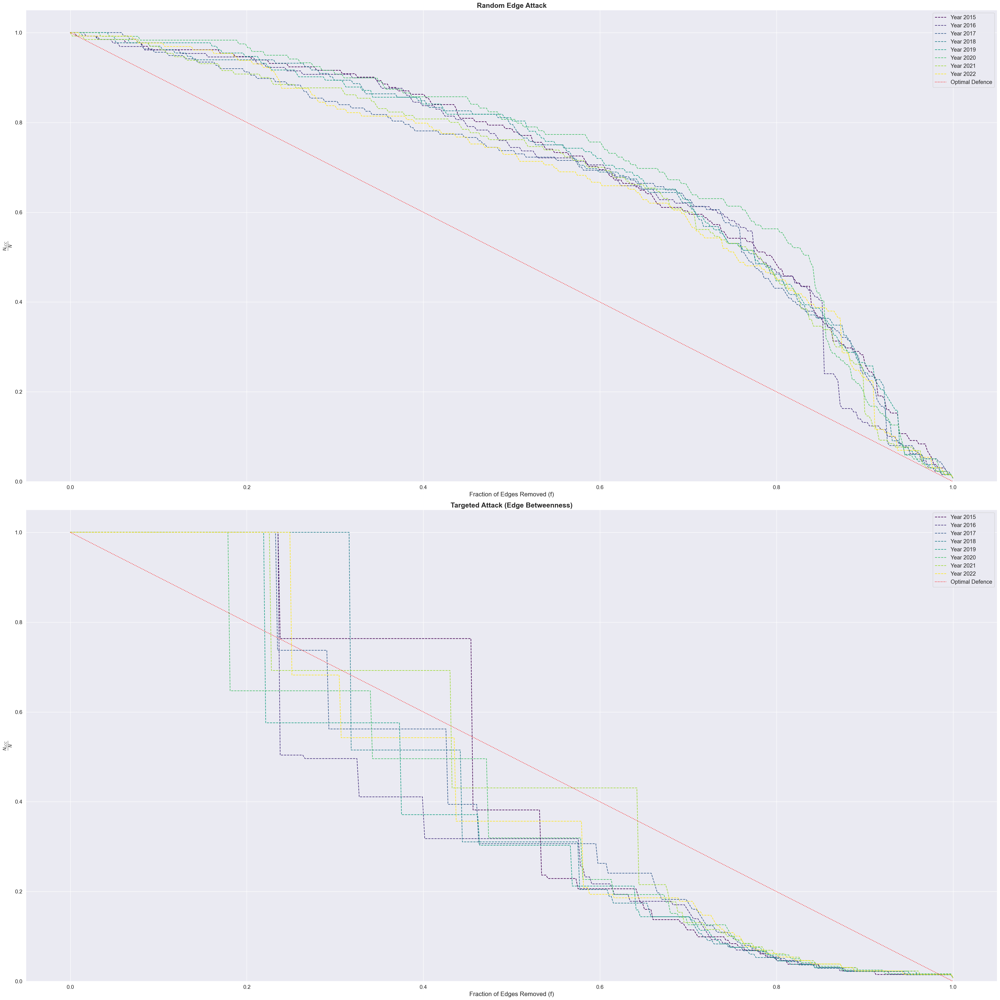

In [20]:
import polars as pl
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import random

##############################################
# Setup and Filtering Data
##############################################

df_fluorine = df.filter(pl.col("k") == 280130).to_pandas()

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = (10, 6)

years = sorted(df_fluorine['t'].unique())

##############################################
# Constructing Yearly Networks
##############################################
yearly_graphs = {}
for y in years:
    df_year = df_fluorine[df_fluorine['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['v'].sum()
    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        value = row['v']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += value
            else:
                G.add_edge(exporter, importer, weight=value)
    yearly_graphs[y] = G
    
##############################################
# Attack Simulations
##############################################
def targeted_closeness_attack(G):
    """Remove highest closeness node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]
    
    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        close = nx.closeness_centrality(G_copy)
        target = max(close, key=close.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_eigenvector_attack(G):
    """Remove highest eigenvector centrality node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        eig = nx.eigenvector_centrality(G_copy, max_iter=1000, weight='weight')
        target = max(eig, key=eig.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_pagerank_attack(G):
    """Remove highest PageRank node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        pr = nx.pagerank(G_copy, weight='weight')
        target = max(pr, key=pr.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_edge_betweenness_attack(G):
    """Remove highest edge betweenness edge iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]
    
    while G_copy.number_of_edges() > 0:
        edge_bet = nx.edge_betweenness_centrality(G_copy, weight='weight')
        target = max(edge_bet, key=edge_bet.get)
        G_copy.remove_edge(*target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def largest_cc_size(G):
    if len(G) == 0:
        return 0
    return len(max(nx.connected_components(G), key=len))

def random_node_attack(G):
    """Remove nodes at random one by one, record LCC size."""
    nodes = list(G.nodes())
    random.shuffle(nodes)
    lcc_sizes = []
    G_copy = G.copy()
    initial_lcc = largest_cc_size(G_copy)
    lcc_sizes.append(initial_lcc)
    
    for n in nodes:
        G_copy.remove_node(n)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_degree_attack(G):
    """Remove highest-degree node iteratively."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]
    
    while len(G_copy) > 0:
        deg = dict(G_copy.degree(weight='weight'))
        target = max(deg, key=deg.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def targeted_betweenness_dynamic_attack(G):
    """Remove highest betweenness node each iteration (dynamic recalculation)."""
    G_copy = G.copy()
    lcc_sizes = [largest_cc_size(G_copy)]

    while len(G_copy) > 0:
        if len(G_copy) == 1:
            G_copy.remove_node(list(G_copy.nodes())[0])
            lcc_sizes.append(largest_cc_size(G_copy))
            break

        bet = nx.betweenness_centrality(G_copy, weight='weight')
        target = max(bet, key=bet.get)
        G_copy.remove_node(target)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

def random_edge_attack(G):
    """Remove edges at random one by one, record LCC size."""
    G_copy = G.copy()
    edges = list(G_copy.edges())
    random.shuffle(edges)
    lcc_sizes = [largest_cc_size(G_copy)]
    for e in edges:
        G_copy.remove_edge(*e)
        lcc_sizes.append(largest_cc_size(G_copy))
    return lcc_sizes

##############################################
# Prepare results_list for plot_attacks
##############################################
results_list = []
for y in years:
    G = yearly_graphs[y]
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    random_node_lcc = random_node_attack(G)
    targeted_deg_lcc = targeted_degree_attack(G)
    targeted_bet_lcc = targeted_betweenness_dynamic_attack(G)
    random_edge_lcc = random_edge_attack(G)

    targeted_close_lcc = targeted_closeness_attack(G)
    targeted_pr_lcc = targeted_pagerank_attack(G)
    targeted_edge_bet_lcc = targeted_edge_betweenness_attack(G)

    results = {
        'title': f"Year {y}",
        'num_nodes': num_nodes,
        'num_edges': num_edges,
        'random_node': random_node_lcc,
        'targeted_degree': targeted_deg_lcc,
        'targeted_betweenness_dynamic': targeted_bet_lcc,
        'random_edge': random_edge_lcc,
        'targeted_closeness': targeted_close_lcc,
        'targeted_pagerank': targeted_pr_lcc,
        'targeted_edge_betweenness': targeted_edge_bet_lcc
    }
    results_list.append(results)

##############################################
# Compute AUC (Robustness Index)
##############################################
def compute_auc(fractions, sizes):
    auc = 0.0
    for i in range(len(fractions)-1):
        x1, x2 = fractions[i], fractions[i+1]
        y1, y2 = sizes[i], sizes[i+1]
        auc += (x2 - x1) * (y1 + y2) / 2.0
    return auc

##############################################
# Visualization
##############################################
def plot_attacks(results_list):

    attack_types_node = [
        'random_node',
        'targeted_degree',
        'targeted_betweenness_dynamic',
        'targeted_closeness',
        'targeted_pagerank'
    ]
    
    attack_types_edge = [
        'random_edge',
        'targeted_edge_betweenness'
    ]

    attack_labels = {
        'random_node': 'Random Node Attack',
        'random_edge': 'Random Edge Attack',
        'targeted_degree': 'Targeted Attack (Degree Centrality)',
        'targeted_betweenness_dynamic': 'Targeted Attack (Betweenness Centrality)',
        'targeted_closeness': 'Targeted Attack (Closeness Centrality)',
        'targeted_eigenvector': 'Targeted Attack (Eigenvector Centrality)',
        'targeted_pagerank': 'Targeted Attack (PageRank)',
        'targeted_edge_betweenness': 'Targeted Attack (Edge Betweenness)'
    }

    graph_results = {}
    robustness_summary = []
    
    for results in results_list:
        title = results['title']
        num_nodes = results['num_nodes']
        num_edges = results['num_edges']

        graph_results[title] = {'num_nodes': num_nodes, 'num_edges': num_edges}

        for attack in attack_labels.keys():
            if attack in results:
                lcc_sizes = results[attack]
                initial_lcc_size = lcc_sizes[0]
                sizes = [size / initial_lcc_size for size in lcc_sizes]

                if attack in attack_types_node:
                    fractions_removed = [(i) / num_nodes for i in range(len(sizes))]
                elif attack in attack_types_edge:
                    fractions_removed = [(i) / num_edges for i in range(len(sizes))]
                else:
                    continue
                
                auc_value = compute_auc(fractions_removed, sizes)
                robustness_summary.append((title, attack_labels[attack], auc_value))
                
                graph_results[title][attack] = {
                    'fractions_removed': fractions_removed,
                    'sizes': sizes,
                    'auc': auc_value
                }

    ##############################################
    # Plot Individual Year Figures
    ##############################################
    for title, data in graph_results.items():
        fig, axs = plt.subplots(1, 2, figsize=(14, 6), dpi=100)
        fig.suptitle(title, fontsize=16, fontweight='bold')

        ax = axs[0]
        for attack in attack_types_node:
            if attack in data:
                fractions_removed = data[attack]['fractions_removed']
                sizes = data[attack]['sizes']
                ax.plot(fractions_removed, sizes, label=attack_labels[attack])

        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Nodes Removed (f)", fontsize=12)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=12)
        ax.set_title("Node Attacks", fontweight="bold")
        ax.legend(fontsize='medium')
        ax.grid(True)
        ax.set_ylim(0, 1.05)

        ax = axs[1]
        for attack in attack_types_edge:
            if attack in data:
                fractions_removed = data[attack]['fractions_removed']
                sizes = data[attack]['sizes']
                ax.plot(fractions_removed, sizes, label=attack_labels[attack], linestyle='--')
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Edges Removed (f)", fontsize=12)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=12)
        ax.set_title("Edge Attacks", fontweight="bold")
        ax.legend(fontsize='medium')
        ax.grid(True)
        ax.set_ylim(0, 1.05)

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

    ##############################################
    # Prepare data for Aggregated Plots
    ##############################################
    attack_results_node = {attack: {} for attack in attack_types_node}
    attack_results_edge = {attack: {} for attack in attack_types_edge}

    for results in results_list:
        title = results['title']
        num_nodes = results['num_nodes']
        num_edges = results['num_edges']

        for attack in attack_labels.keys():
            if attack in results:
                lcc_sizes = results[attack]
                initial_lcc_size = lcc_sizes[0]
                sizes = [size / initial_lcc_size for size in lcc_sizes]

                if attack in attack_types_node:
                    fractions_removed = [(i) / num_nodes for i in range(len(sizes))]
                    attack_results_node[attack][title] = (fractions_removed, sizes)
                elif attack in attack_types_edge:
                    fractions_removed = [(i) / num_edges for i in range(len(sizes))]
                    attack_results_edge[attack][title] = (fractions_removed, sizes)

    cmap = plt.get_cmap("viridis")

    ##############################################
    # Aggregated Node Attacks
    ##############################################
    num_attacks_node = len(attack_types_node)
    cols = 1
    rows = (num_attacks_node + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(36, 36))
    axs = axs.flatten()
    
    for idx, attack in enumerate(attack_types_node):
        ax = axs[idx]
        titles = list(attack_results_node[attack].keys())

        titles = [t for t in titles if int(t.split()[-1]) >= 2015]
    
        N = len(titles)
        for i, t in enumerate(titles):
            fractions_removed, sizes = attack_results_node[attack][t]
            color = cmap(i / max(1, N-1))
            ax.plot(fractions_removed, sizes, label=t, color=color)
    
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Nodes Removed (f)", fontsize=16)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=16)
        ax.set_title(attack_labels[attack], fontweight="bold", fontsize=18)
        ax.grid(True)
        ax.legend(fontsize='large', loc='upper right')
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='both', which='major', labelsize=14)
    
    for k in range(num_attacks_node, rows*cols):
        fig.delaxes(axs[k])
    
    plt.tight_layout()
    plt.show()
    
    ##############################################
    # Aggregated Edge Attacks
    ##############################################
    num_attacks_edge = len(attack_types_edge)
    cols = 1
    rows = (num_attacks_edge + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(36, 36))
    if num_attacks_edge == 1:
        axs = [axs]
    
    for idx, attack in enumerate(attack_types_edge):
        ax = axs[idx]
        titles = list(attack_results_edge[attack].keys())

        titles = [t for t in titles if int(t.split()[-1]) >= 2015]
    
        N = len(titles)
        for i, t in enumerate(titles):
            fractions_removed, sizes = attack_results_edge[attack][t]
            color = cmap(i / max(1, N-1))
            ax.plot(fractions_removed, sizes, label=t, linestyle='--', color=color)
    
        ax.plot([0, 1], [1, 0], linestyle=':', label='Optimal Defence', color='red')
        ax.set_xlabel("Fraction of Edges Removed (f)", fontsize=16)
        ax.set_ylabel(r"$\frac{N_{LCC}}{N}$", fontsize=16)
        ax.set_title(attack_labels[attack], fontweight="bold", fontsize=18)
        ax.grid(True)
        ax.legend(fontsize='large', loc='upper right')
        ax.set_ylim(0, 1.05)
        ax.tick_params(axis='both', which='major', labelsize=14)
    
    plt.tight_layout()
    plt.show()
    
    robustness_df = pd.DataFrame(robustness_summary, columns=["Title", "Attack", "AUC"])
    return robustness_df
    
robustness_df = plot_attacks(results_list)

In [21]:
robustness_df

,Title,Attack,AUC
0,Year 2002,Random Node Attack,0.407662
1,Year 2002,Random Edge Attack,0.654285
2,Year 2002,Targeted Attack (Degree Centrality),0.111774
3,Year 2002,Targeted Attack (Betweenness Centrality),0.109326
4,Year 2002,Targeted Attack (Closeness Centrality),0.087185
...,...,...,...
142,Year 2022,Targeted Attack (Degree Centrality),0.122679
143,Year 2022,Targeted Attack (Betweenness Centrality),0.107896
144,Year 2022,Targeted Attack (Closeness Centrality),0.091912
145,Year 2022,Targeted Attack (PageRank),0.108858


## Macro Stats

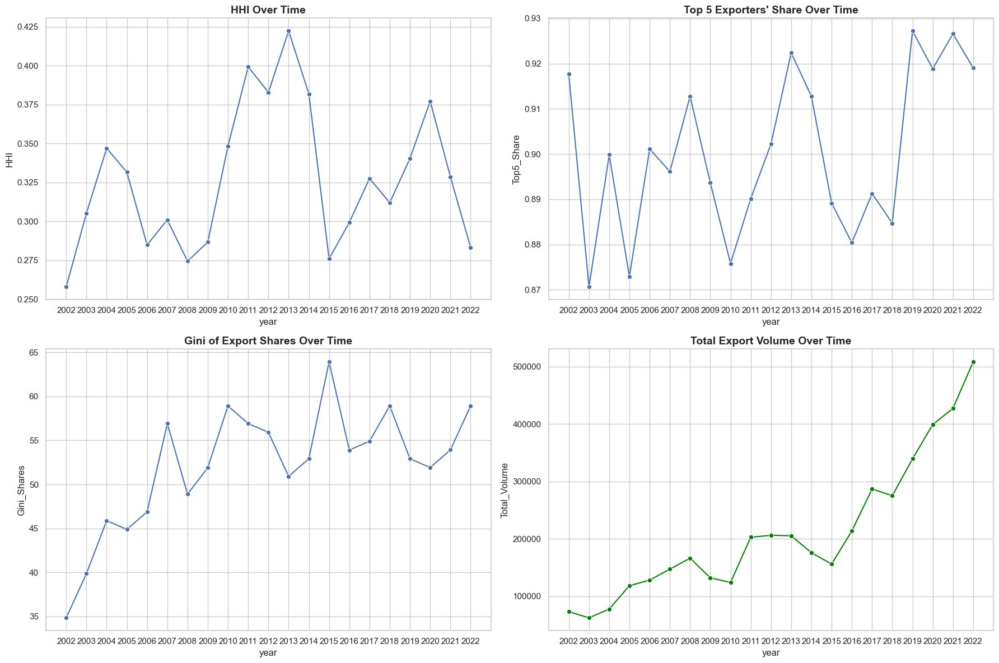

In [22]:
import polars as pl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df_fluorine = df.filter(pl.col("k") == 280130).to_pandas()
df_fluorine['t'] = df_fluorine['t'].astype(int)

yearly_exports = (
    df_fluorine.groupby(["t", "export_country"], as_index=False)["v"].sum()
)

years_list = []
hhi_list = []
top5_share_list = []
gini_list = []
shannon_list = []
total_volume_list = []

def gini_coefficient(arr):
    arr = np.array(arr)
    arr = arr[arr > 0]
    arr = np.sort(arr)
    n = len(arr)
    if n == 0:
        return np.nan
    
    cumulative = np.cumsum(arr)
    sum_arr = cumulative[-1]
    if sum_arr == 0:
        return 0.0

    rel_cumulative = cumulative / sum_arr
    return (n+1 - 2*np.sum(rel_cumulative)/n)

for year, grp in yearly_exports.groupby("t"):
    total_exports = grp["v"].sum()
    shares = grp["v"] / total_exports

    # HHI (Herfindhal Hirschman Index)
    hhi = (shares ** 2).sum()

    # Top 5 Exporter Share
    sorted_shares = np.sort(shares)[::-1]
    top5 = sorted_shares[:5].sum() if len(sorted_shares)>=5 else sorted_shares.sum()

    # Gini Coefficient of Exporter Share
    gini_val = gini_coefficient(shares.values)

    years_list.append(year)
    hhi_list.append(hhi)
    top5_share_list.append(top5)
    gini_list.append(gini_val)
    total_volume_list.append(total_exports)

metrics_df = pd.DataFrame({
    "year": years_list,
    "HHI": hhi_list,
    "Top5_Share": top5_share_list,
    "Gini_Shares": gini_list,
    "Total_Volume": total_volume_list
})

sns.set_theme(style="whitegrid")
fig, axs = plt.subplots(2, 2, figsize=(18, 12))
axs = axs.flatten()

sns.lineplot(data=metrics_df, x="year", y="HHI", marker="o", ax=axs[0])
axs[0].set_title("HHI Over Time", fontsize=14, fontweight='bold')
axs[0].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Top5_Share", marker="o", ax=axs[1])
axs[1].set_title("Top 5 Exporters' Share Over Time", fontsize=14, fontweight='bold')
axs[1].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Gini_Shares", marker="o", ax=axs[2])
axs[2].set_title("Gini of Export Shares Over Time", fontsize=14, fontweight='bold')
axs[2].set_xticks(metrics_df["year"].unique().astype(int))

sns.lineplot(data=metrics_df, x="year", y="Total_Volume", marker="o", ax=axs[3], color='green')
axs[3].set_title("Total Export Volume Over Time", fontsize=14, fontweight='bold')
axs[3].set_xticks(metrics_df["year"].unique().astype(int))

plt.tight_layout()
plt.show()

In [14]:
##############################################
#
# INTERPRETATION:
#
##############################################

# HHI
##############################################
# If the HHI is close to 1, it means one exporter dominates nearly all trade.
# HHI increased sharply from 2017 onwards leading to a more concentrated network
##############################################


# Top5 Exporter Shares
##############################################


# Gini of Export Shares
##############################################


# Total Export Volume
##############################################




## Network Metrics Over Time

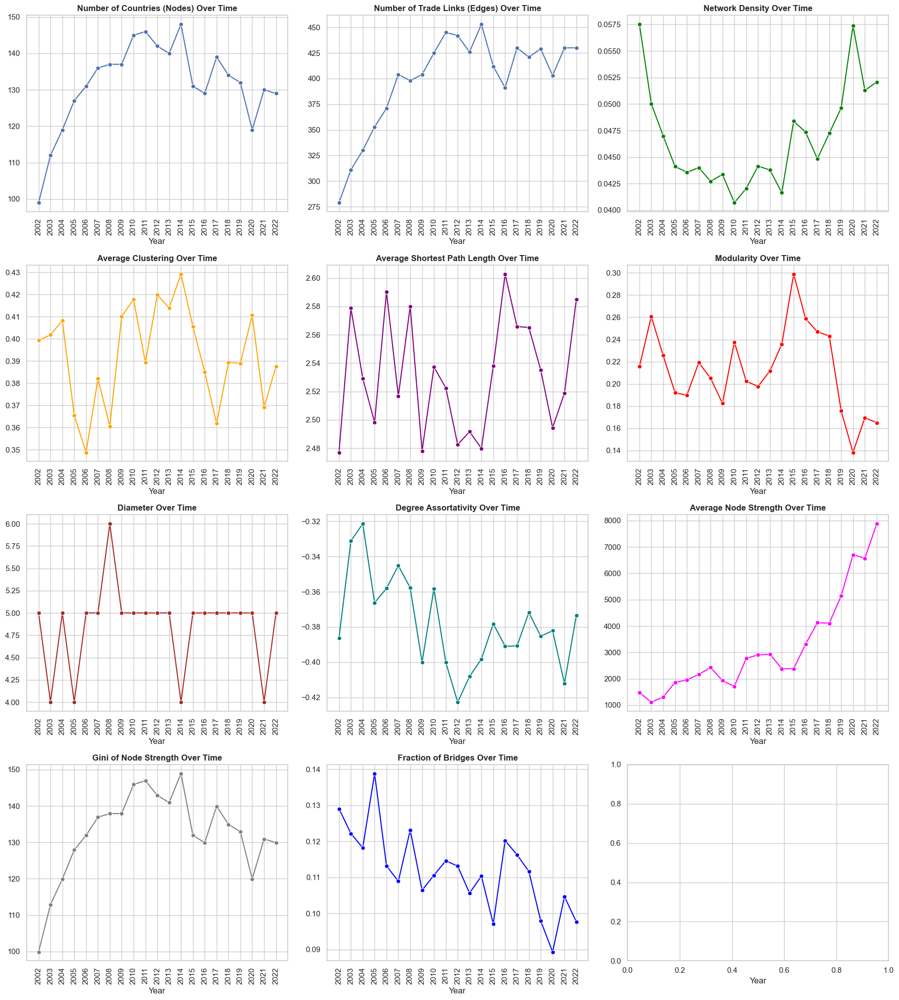

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
from community import community_louvain

df_fluorine = df.filter(pl.col("k") == 280130).to_pandas()

years = sorted(df_fluorine['t'].unique())

##############################################
# Building Yearly Graphs
##############################################
yearly_graphs = {}
for y in years:
    df_year = df_fluorine[df_fluorine['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['v'].sum()
    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        value = row['v']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += value
            else:
                G.add_edge(exporter, importer, weight=value)
    yearly_graphs[y] = G

##############################################
# Helper Functions
##############################################
def compute_diameter(G):
    if G.number_of_nodes() == 0:
        return np.nan
    if nx.is_connected(G):
        return nx.diameter(G)
    else:
        GCC = max(nx.connected_components(G), key=len)
        G_sub = G.subgraph(GCC)
        if G_sub.number_of_nodes() > 1:
            return nx.diameter(G_sub)
        else:
            return 0.0

def compute_degree_assortativity(G):
    if G.number_of_edges() > 0:
        return nx.degree_assortativity_coefficient(G, x='degree')
    else:
        return np.nan

def compute_avg_node_strength(G):
    if G.number_of_nodes() == 0:
        return np.nan
    strengths = []
    for n in G.nodes():
        strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
        strengths.append(strength)
    if len(strengths) > 0:
        return np.mean(strengths)
    else:
        return np.nan

def gini_coefficient(values):
    arr = np.sort(values)
    n = len(arr)
    if n == 0:
        return np.nan

    cumulative = np.cumsum(arr)
    sum_arr = cumulative[-1]
    if sum_arr == 0:
        return 0.0

    rel_cumulative = cumulative / sum_arr
    return (n+1 - 2*np.sum(rel_cumulative)/n)

def compute_gini_node_strength(G):
    if G.number_of_nodes() == 0:
        return np.nan
    strengths = [sum(d['weight'] for _,_,d in G.edges(n, data=True)) for n in G.nodes()]
    if len(strengths) == 0:
        return np.nan
    return gini_coefficient(strengths)

def compute_fraction_bridges(G):
    if G.number_of_edges() == 0:
        return 0.0
    bridges = list(nx.bridges(G))
    return len(bridges) / G.number_of_edges()

##############################################
# Network Metrics Over Time
##############################################
results = {
    'year': [],
    'num_nodes': [],
    'num_edges': [],
    'density': [],
    'avg_clustering': [],
    'avg_shortest_path': [],
    'modularity': [],
    'num_communities': [],
    'diameter': [],
    'degree_assortativity': [],
    'avg_node_strength': [],
    'gini_node_strength': [],
    'fraction_bridges': []
}

for y, G in yearly_graphs.items():
    num_nodes = G.number_of_nodes()
    num_edges = G.number_of_edges()

    density = nx.density(G)

    # Average Clustering Coefficient
    avg_clustering = nx.average_clustering(G)
    
    # Average shortest path length
    if nx.is_connected(G):
        avg_sp = nx.average_shortest_path_length(G)
    else:
        GCC = max(nx.connected_components(G), key=len)
        G_sub = G.subgraph(GCC)
        avg_sp = nx.average_shortest_path_length(G_sub)

    # Community Detection
    partition = community_louvain.best_partition(G, weight='weight')
    mod = community_louvain.modularity(partition, G, weight='weight')
    num_com = len(set(partition.values()))
    
    # Diameter
    diameter = compute_diameter(G)
    
    # Degree Assortativity
    degree_assort = compute_degree_assortativity(G)
    
    # Average Node Strength
    avg_strength = compute_avg_node_strength(G)
    
    # Gini Coefficient of Node Strength
    gini_strength = compute_gini_node_strength(G)
    
    # Fraction Bridges
    frac_bridges = compute_fraction_bridges(G)
    
    results['year'].append(y)
    results['num_nodes'].append(num_nodes)
    results['num_edges'].append(num_edges)
    results['density'].append(density)
    results['avg_clustering'].append(avg_clustering)
    results['avg_shortest_path'].append(avg_sp)
    results['modularity'].append(mod)
    results['num_communities'].append(num_com)
    results['diameter'].append(diameter)
    results['degree_assortativity'].append(degree_assort)
    results['avg_node_strength'].append(avg_strength)
    results['gini_node_strength'].append(gini_strength)
    results['fraction_bridges'].append(frac_bridges)

results_df = pd.DataFrame(results)

##############################################
# Visualization
##############################################
sns.set_theme(style="whitegrid")

fig, axs = plt.subplots(4, 3, figsize=(18, 20))
axs = axs.flatten()

sns.lineplot(data=results_df, x='year', y='num_nodes', ax=axs[0], marker='o')
axs[0].set_title("Number of Countries (Nodes) Over Time", fontweight="bold")
axs[0].set_xticks(results_df["year"].unique().astype(int))
axs[0].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='num_edges', ax=axs[1], marker='o')
axs[1].set_title("Number of Trade Links (Edges) Over Time", fontweight="bold")
axs[1].set_xticks(results_df["year"].unique().astype(int))
axs[1].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='density', ax=axs[2], marker='o', color='green')
axs[2].set_title("Network Density Over Time", fontweight="bold")
axs[2].set_xticks(results_df["year"].unique().astype(int))
axs[2].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_clustering', ax=axs[3], marker='o', color='orange')
axs[3].set_title("Average Clustering Over Time", fontweight="bold")
axs[3].set_xticks(results_df["year"].unique().astype(int))
axs[3].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_shortest_path', ax=axs[4], marker='o', color='purple')
axs[4].set_title("Average Shortest Path Length Over Time", fontweight="bold")
axs[4].set_xticks(results_df["year"].unique().astype(int))
axs[4].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='modularity', ax=axs[5], marker='o', color='red')
axs[5].set_title("Modularity Over Time", fontweight="bold")
axs[5].set_xticks(results_df["year"].unique().astype(int))
axs[5].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='diameter', ax=axs[6], marker='o', color='brown')
axs[6].set_title("Diameter Over Time", fontweight="bold")
axs[6].set_xticks(results_df["year"].unique().astype(int))
axs[6].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='degree_assortativity', ax=axs[7], marker='o', color='teal')
axs[7].set_title("Degree Assortativity Over Time", fontweight="bold")
axs[7].set_xticks(results_df["year"].unique().astype(int))
axs[7].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='avg_node_strength', ax=axs[8], marker='o', color='magenta')
axs[8].set_title("Average Node Strength Over Time", fontweight="bold")
axs[8].set_xticks(results_df["year"].unique().astype(int))
axs[8].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='gini_node_strength', ax=axs[9], marker='o', color='gray')
axs[9].set_title("Gini of Node Strength Over Time", fontweight="bold")
axs[9].set_xticks(results_df["year"].unique().astype(int))
axs[9].tick_params(axis='x', labelrotation=90)

sns.lineplot(data=results_df, x='year', y='fraction_bridges', ax=axs[10], marker='o', color='blue')
axs[10].set_title("Fraction of Bridges Over Time", fontweight="bold")
axs[10].set_xticks(results_df["year"].unique().astype(int))
axs[10].tick_params(axis='x', labelrotation=90)

for ax in axs:
    ax.set_xlabel("Year")
    ax.set_ylabel("")
    ax.grid(True)

plt.tight_layout()
plt.show()

### Community Stability Over Time

Community Stability Over Time (NMI):
 [(2002, 2003, 0.2821472324864436), (2003, 2004, 0.4614763657571734), (2004, 2005, 0.27385054932575614), (2005, 2006, 0.3255933151273444), (2006, 2007, 0.3946966307564088), (2007, 2008, 0.31856621339974545), (2008, 2009, 0.316272786140064), (2009, 2010, 0.29432019234315127), (2010, 2011, 0.35854303091441625), (2011, 2012, 0.4474111661891449), (2012, 2013, 0.47148619692894383), (2013, 2014, 0.3090765141326778), (2014, 2015, 0.3615454447868586), (2015, 2016, 0.4287524356357158), (2016, 2017, 0.4506176969808531), (2017, 2018, 0.3933497783046563), (2018, 2019, 0.3792710242599317), (2019, 2020, 0.5499684396071954), (2020, 2021, 0.35029797365184556), (2021, 2022, 0.3926197132212072)]


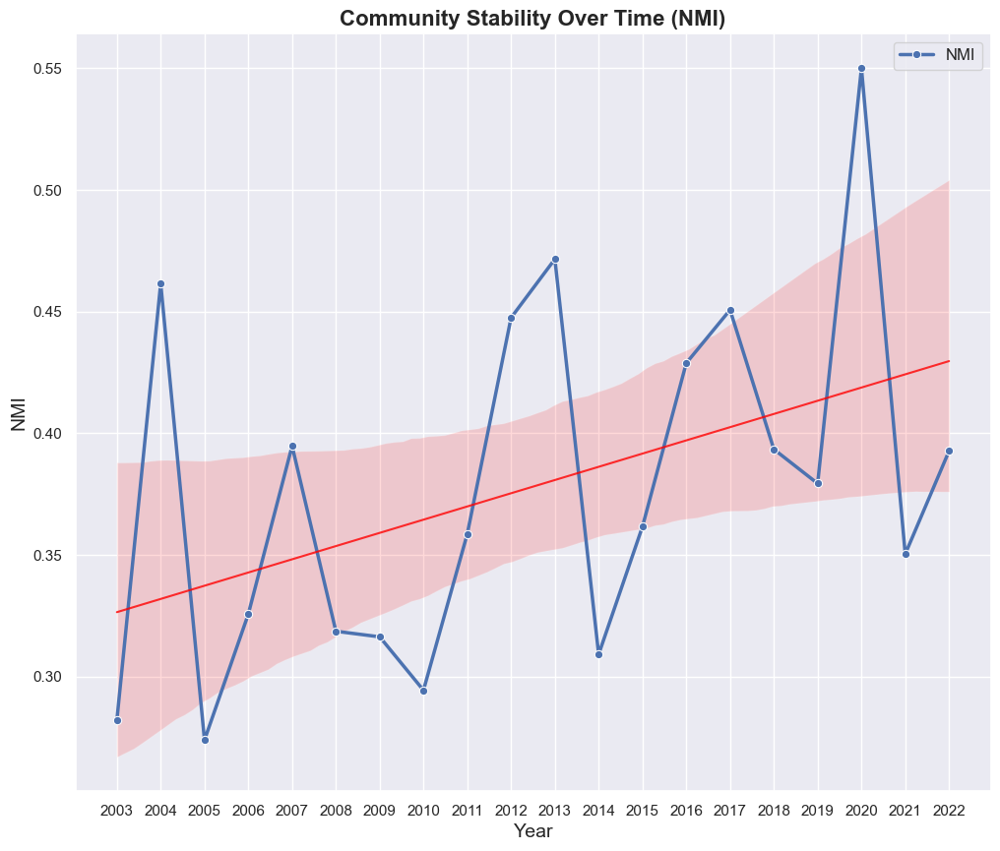

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
from sklearn.metrics.cluster import normalized_mutual_info_score

##############################################
# Data Loading
##############################################
cc_df = loader.country_codes.to_pandas() 
country_code_to_name = dict(zip(cc_df["country_code"], cc_df["country_name"]))
country_code_to_iso3 = dict(zip(cc_df["country_code"], cc_df["country_iso3"]))

##############################################
# Communities Per Year
##############################################
year_communities = {}
for y, G in yearly_graphs.items():
    comms = greedy_modularity_communities(G, weight='weight')
    node2comm = {}
    for i, cset in enumerate(comms):
        for node in cset:
            node2comm[node] = i
    year_communities[y] = node2comm

##############################################
# Year-to-Year Community Stability (NMI)
##############################################
years_sorted = sorted(yearly_graphs.keys())
stability_results = []
for i in range(len(years_sorted)-1):
    y1, y2 = years_sorted[i], years_sorted[i+1]
    common_nodes = set(year_communities[y1].keys()).intersection(year_communities[y2].keys())
    c1 = [year_communities[y1][n] for n in common_nodes]
    c2 = [year_communities[y2][n] for n in common_nodes]
    nmi = normalized_mutual_info_score(c1, c2)
    stability_results.append((y1, y2, nmi))

print("Community Stability Over Time (NMI):\n", stability_results)

##############################################
# Visualization
##############################################
nmi_df = pd.DataFrame(stability_results, columns=['year_start', 'year_end', 'NMI'])
nmi_df['year'] = nmi_df['year_end']

plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")

sns.lineplot(x='year', y='NMI', data=nmi_df, marker='o', linewidth=2.5, label='NMI')
sns.regplot(x='year', y='NMI', data=nmi_df, scatter=False, 
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Community Stability Over Time (NMI)", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(nmi_df["year"].unique().astype(int))
plt.ylabel("NMI", fontsize=14)
plt.legend(fontsize=12)

Intra-Community Trade Ratio Over Time:
 [(2002, 0.5160006603361911), (2003, 0.613489861697205), (2004, 0.5666296189553642), (2005, 0.5097968560523323), (2006, 0.6427687568840029), (2007, 0.745870120278441), (2008, 0.6288464652276579), (2009, 0.6029337853248603), (2010, 0.6795143967583542), (2011, 0.6612683387196081), (2012, 0.8183205531541397), (2013, 0.8077782753742375), (2014, 0.603628550828055), (2015, 0.7118638975601174), (2016, 0.7598465049634829), (2017, 0.7181180582462462), (2018, 0.6458778145165056), (2019, 0.5915484646502249), (2020, 0.6020055101526851), (2021, 0.6830977464474044), (2022, 0.8407632927693055)]


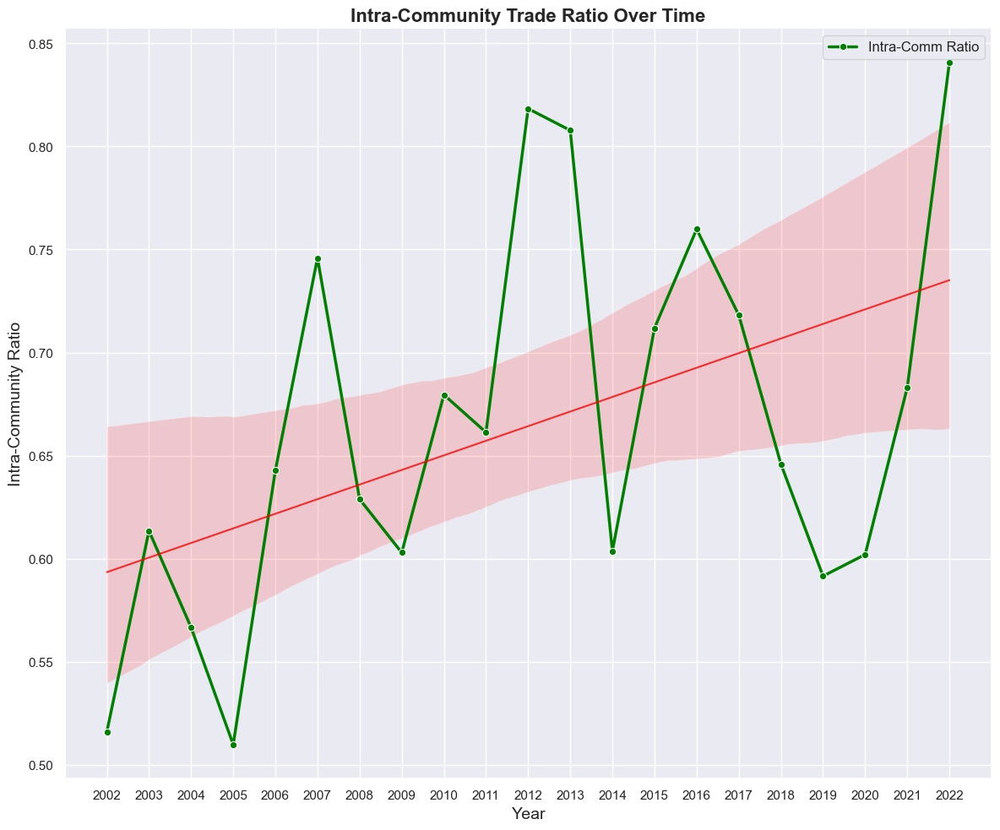

In [29]:
##############################################
# Compute Intra-Community Trade Ratio per Year
##############################################
intra_ratios = []
for y, G in yearly_graphs.items():
    comm_map = year_communities[y]
    intra_weight = 0.0
    inter_weight = 0.0

    for u, v, d in G.edges(data=True):
        if comm_map.get(u) == comm_map.get(v):
            intra_weight += d.get('weight', 0)
        else:
            inter_weight += d.get('weight', 0)

    total_weight = intra_weight + inter_weight
    if total_weight > 0:
        ratio = intra_weight / total_weight
        intra_ratios.append((y, ratio))

print("Intra-Community Trade Ratio Over Time:\n", intra_ratios)

intra_df = pd.DataFrame(intra_ratios, columns=['year', 'intra_ratio'])

##############################################
# Visualization
##############################################
plt.figure(figsize=(12, 10))
sns.set_theme(style="darkgrid")
sns.lineplot(x='year', y='intra_ratio', data=intra_df, marker='o', linewidth=2.5, color='green', label='Intra-Comm Ratio')
sns.regplot(x='year', y='intra_ratio', data=intra_df, scatter=False, 
            line_kws={'color': 'red', 'lw': 1.5, 'alpha':0.8})

plt.title("Intra-Community Trade Ratio Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.xticks(intra_df["year"].unique().astype(int))
plt.ylabel("Intra-Community Ratio", fontsize=14)
plt.legend(fontsize=12)

plt.tight_layout()
plt.show()

### Community Detection

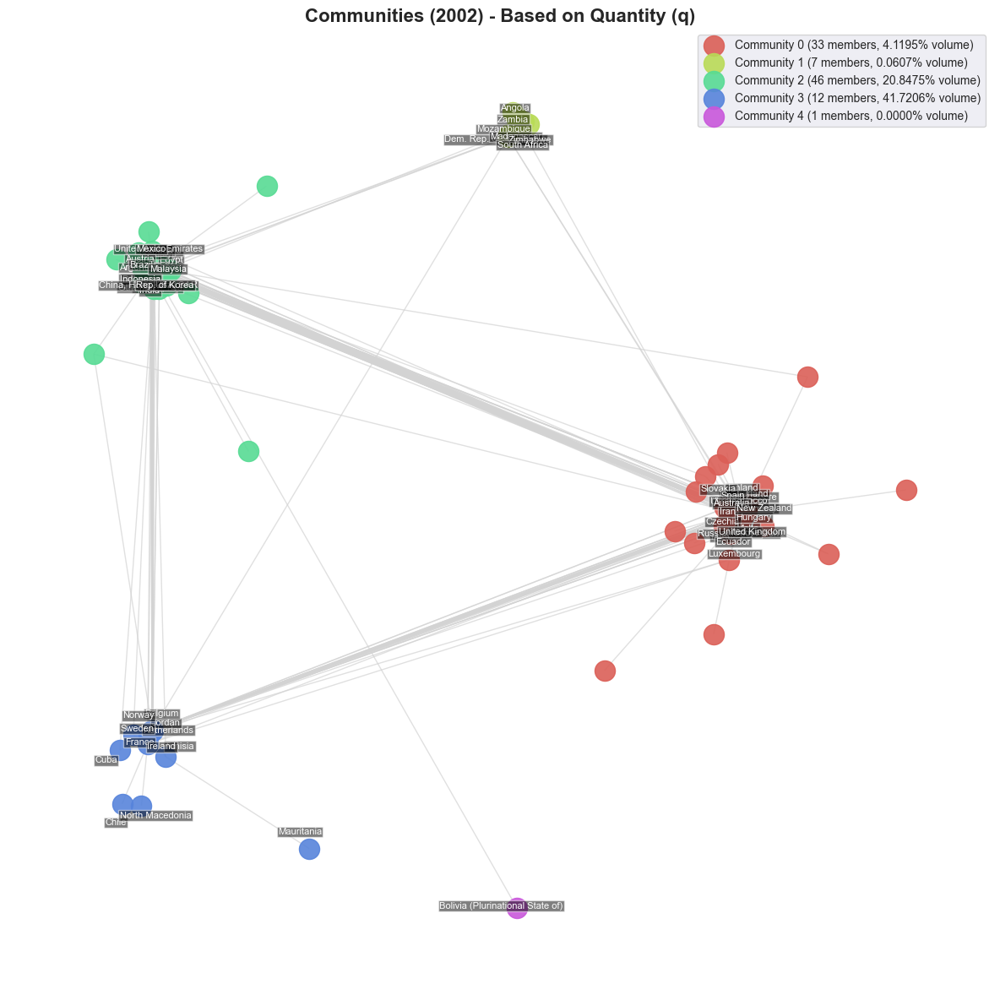

Top Countries by Community based on q:
Community 0:
  United Kingdom | Germany | Switzerland | Iran | Singapore | Ukraine | Spain | Türkiye | Australia | Russian Federation | Morocco | Finland | Czechia | Hungary | Portugal | New Zealand | Slovakia | Luxembourg | Malta | Ecuador
Community 1:
  South Africa | Dem. Rep. of the Congo | Angola | Madagascar | Mozambique | Zimbabwe | Zambia
Community 2:
  Israel | USA | China | Japan | Canada | India | Malaysia | Rep. of Korea | Italy | Mexico | Austria | Other Asia, nes | Indonesia | Bahamas | China, Hong Kong SAR | Brazil | Thailand | Egypt | United Arab Emirates | Argentina
Community 3:
  Belgium | Netherlands | France | Jordan | Ireland | Sweden | Norway | Tunisia | Cuba | North Macedonia | Chile | Mauritania
Community 4:
  Bolivia (Plurinational State of)


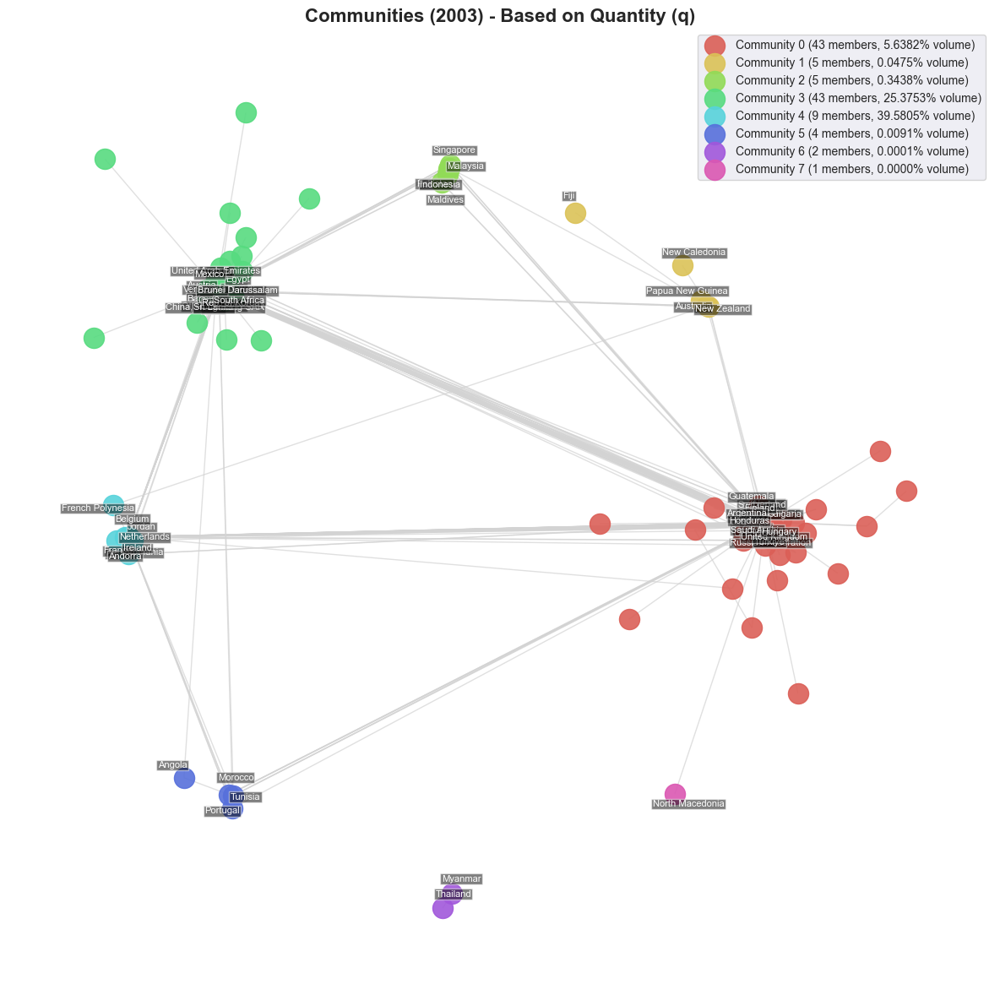

Top Countries by Community based on q:
Community 0:
  United Kingdom | India | Germany | Switzerland | Ukraine | Italy | Russian Federation | Spain | Türkiye | Finland | Czechia | Hungary | Norway | Argentina | Guatemala | Sweden | Saudi Arabia | Honduras | Zambia | Bulgaria
Community 1:
  New Zealand | Australia | Papua New Guinea | New Caledonia | Fiji
Community 2:
  Singapore | Indonesia | Malaysia | Pakistan | Maldives
Community 3:
  Israel | China | USA | Japan | Canada | Rep. of Korea | Austria | Other Asia, nes | Mexico | United Arab Emirates | Bahamas | Brazil | South Africa | China, Hong Kong SAR | Egypt | Venezuela | Mauritius | Sri Lanka | Brunei Darussalam | Cyprus
Community 4:
  Belgium | France | Netherlands | Jordan | Ireland | Algeria | Andorra | Romania | French Polynesia
Community 5:
  Morocco | Portugal | Tunisia | Angola
Community 6:
  Thailand | Myanmar
Community 7:
  North Macedonia


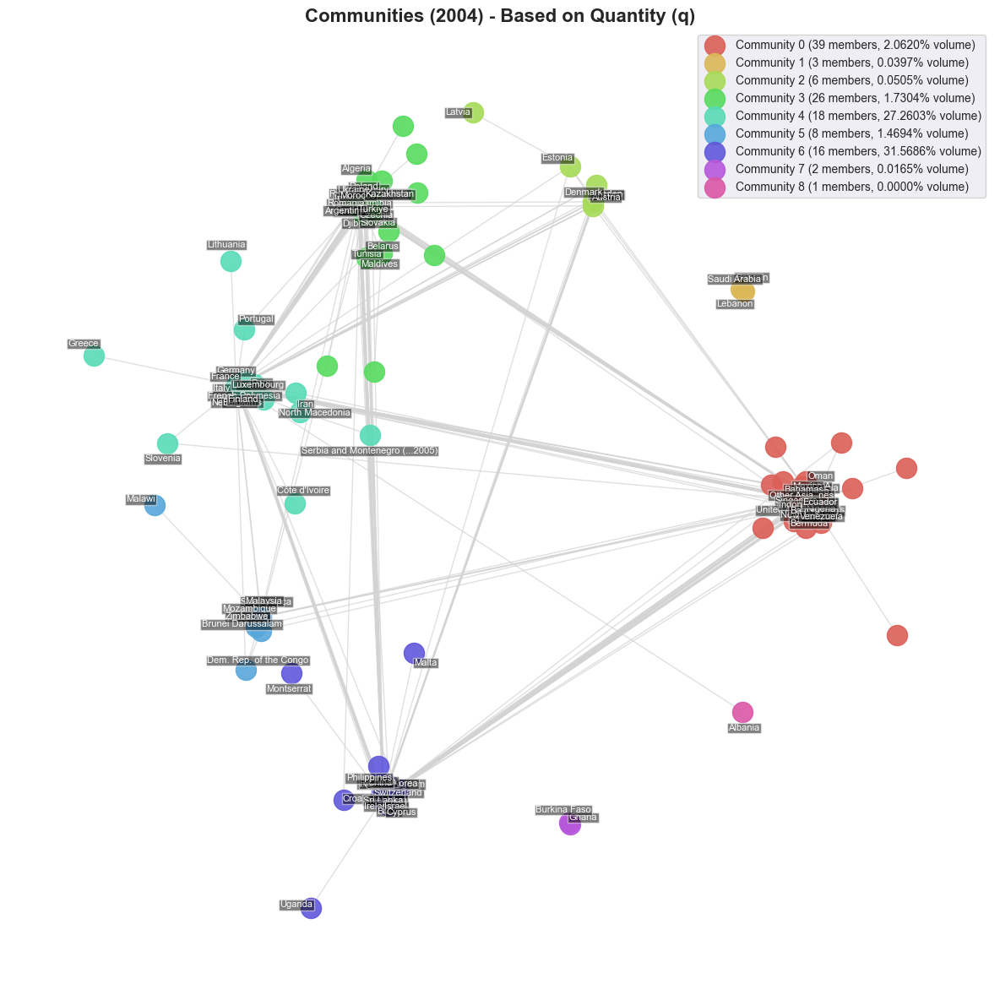

Top Countries by Community based on q:
Community 0:
  USA | Canada | Australia | Mexico | Other Asia, nes | New Zealand | Bahamas | United Arab Emirates | Singapore | Congo | Egypt | Venezuela | Angola | Colombia | Nigeria | Bangladesh | Indonesia | Oman | Ecuador | Bermuda
Community 1:
  Lebanon | Saudi Arabia | Bahrain
Community 2:
  Austria | Sweden | Norway | Denmark | Estonia | Latvia
Community 3:
  India | Ukraine | Russian Federation | Türkiye | Spain | Romania | Argentina | Czechia | Poland | Hungary | Bulgaria | Namibia | Slovakia | Djibouti | Morocco | Algeria | Kazakhstan | Belarus | Tunisia | Maldives
Community 4:
  Belgium | France | Jordan | Netherlands | Germany | Italy | Finland | Luxembourg | French Polynesia | Peru | Portugal | North Macedonia | Iran | Slovenia | Serbia and Montenegro (...2005) | Lithuania | Côte d'Ivoire | Greece
Community 5:
  South Africa | Mozambique | Malaysia | Zimbabwe | Zambia | Brunei Darussalam | Dem. Rep. of the Congo | Malawi
Community 6:


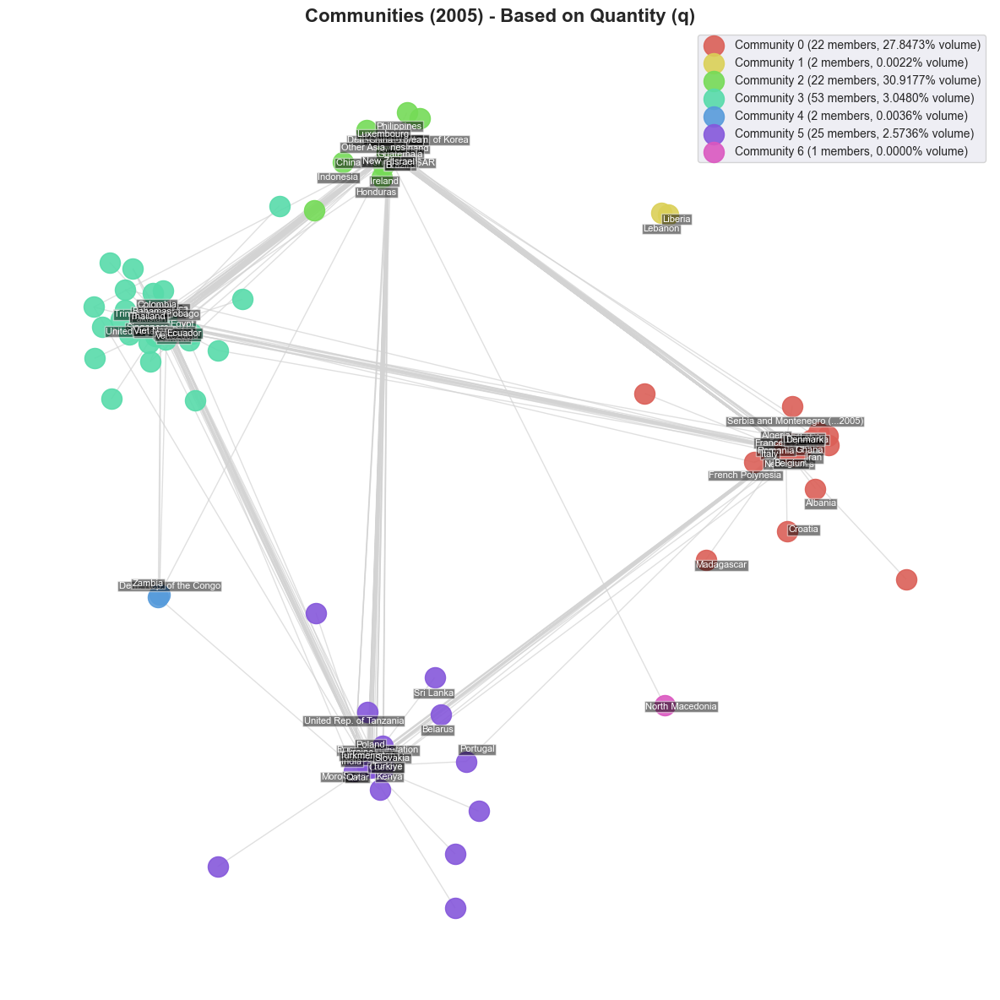

Top Countries by Community based on q:
Community 0:
  Belgium | France | Jordan | Netherlands | Austria | Italy | Sweden | Romania | Algeria | Ghana | Iran | Libya | Denmark | French Polynesia | Estonia | Latvia | Serbia and Montenegro (...2005) | Albania | Croatia | Madagascar
Community 1:
  Lebanon | Liberia
Community 2:
  Israel | China | United Kingdom | Germany | Japan | Switzerland | Rep. of Korea | Other Asia, nes | Brazil | Finland | Guatemala | China, Hong Kong SAR | Ethiopia | New Zealand | Dem. People's Rep. of Korea | Ireland | Honduras | Luxembourg | Indonesia | Philippines
Community 3:
  USA | Canada | South Africa | Mexico | United Arab Emirates | Singapore | Namibia | Australia | Venezuela | Egypt | Argentina | Bahamas | Oman | Malaysia | Viet Nam | Trinidad and Tobago | Thailand | Pakistan | Ecuador | Colombia
Community 4:
  Dem. Rep. of the Congo | Zambia
Community 5:
  India | Ukraine | Qatar | Spain | Russian Federation | Greece | Türkiye | Czechia | Iceland | Hunga

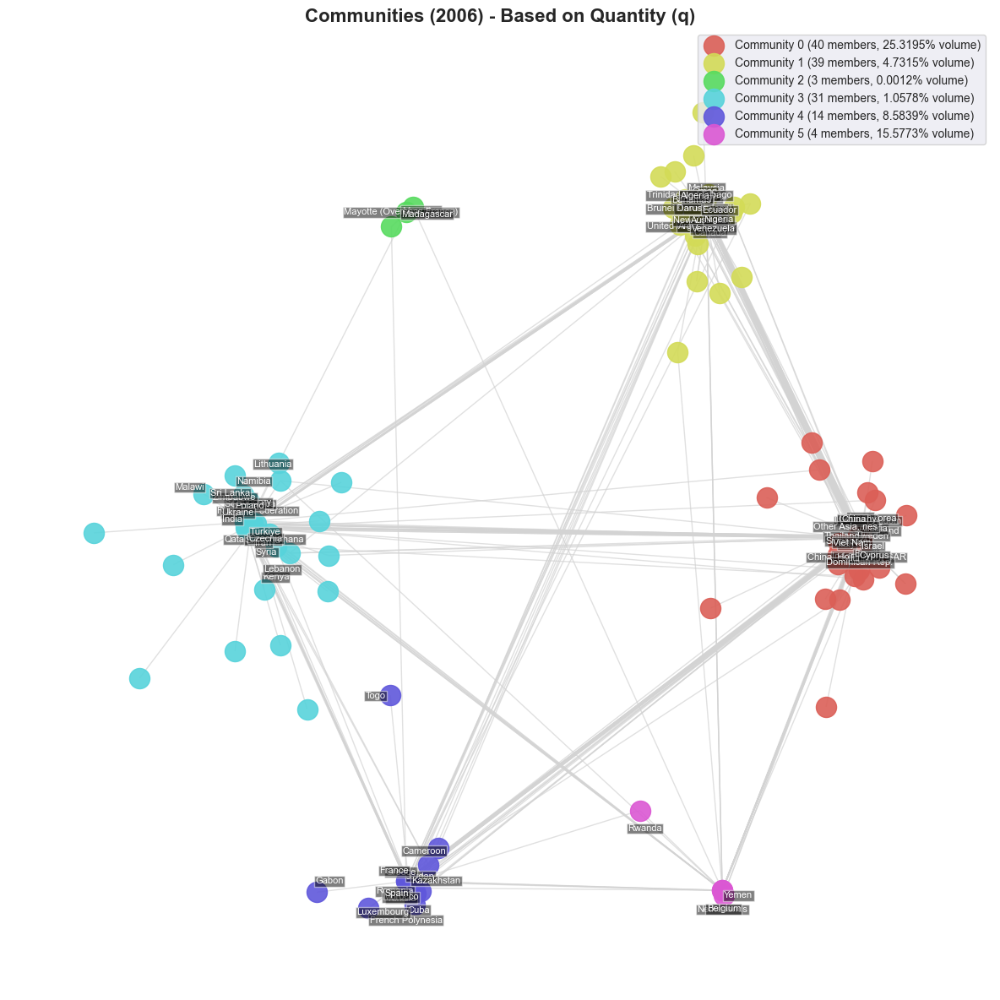

Top Countries by Community based on q:
Community 0:
  Israel | China | United Kingdom | Japan | Germany | Italy | Rep. of Korea | Other Asia, nes | Switzerland | Austria | Singapore | Indonesia | Finland | Thailand | Brazil | China, Hong Kong SAR | Sweden | Viet Nam | Dominican Rep. | Cyprus
Community 1:
  USA | Canada | Mexico | Nigeria | Argentina | Egypt | United Arab Emirates | Kuwait | Malaysia | Venezuela | Bahamas | Oman | New Zealand | Ecuador | Brunei Darussalam | Colombia | Algeria | Australia | Peru | Trinidad and Tobago
Community 2:
  Madagascar | Mauritius | Mayotte (Overseas France)
Community 3:
  India | Ukraine | Qatar | Russian Federation | Türkiye | Iran | South Africa | Poland | Czechia | Hungary | Slovakia | Zimbabwe | Ghana | Namibia | Syria | Lebanon | Sri Lanka | Lithuania | Malawi | Kenya
Community 4:
  France | Jordan | Spain | Greece | Romania | Morocco | Tunisia | Cuba | French Polynesia | Kazakhstan | Luxembourg | Cameroon | Gabon | Togo
Community 5:
  Belgi

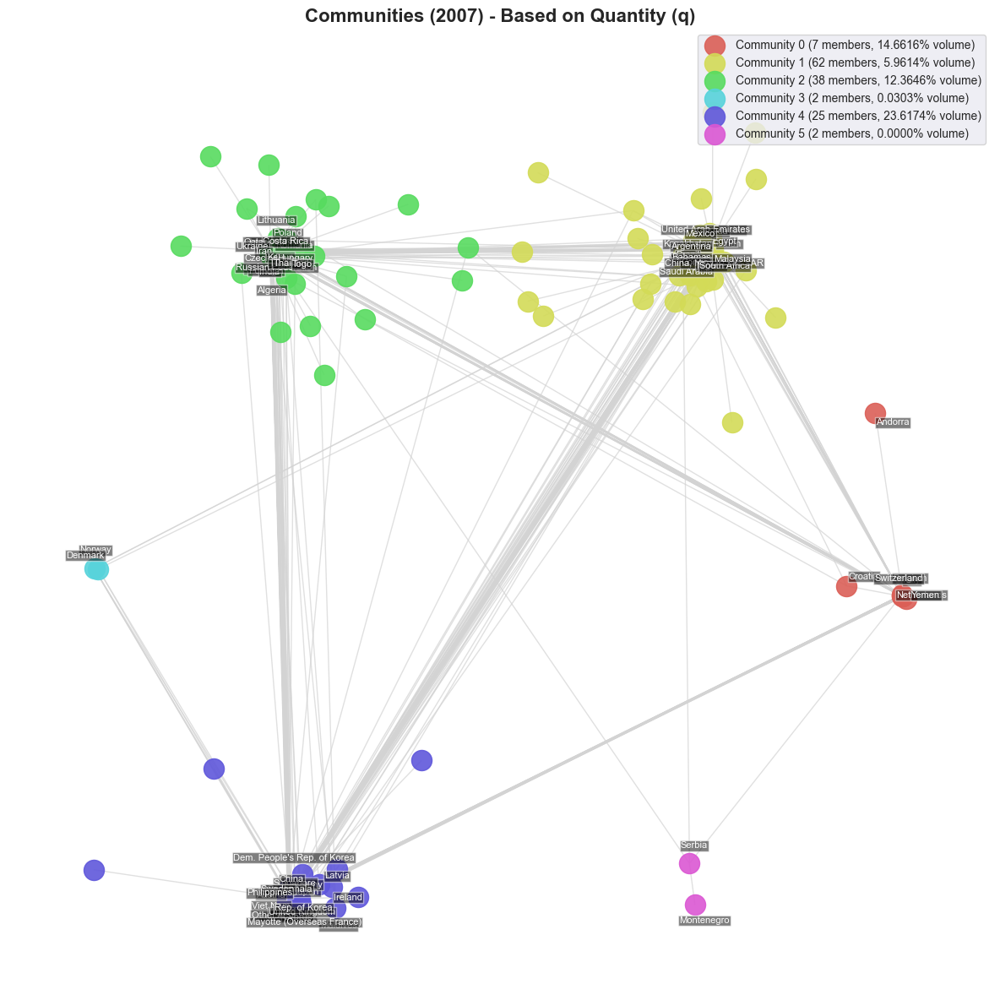

Top Countries by Community based on q:
Community 0:
  Belgium | Netherlands | Italy | Switzerland | Yemen | Croatia | Andorra
Community 1:
  USA | Canada | Mexico | Argentina | South Africa | United Arab Emirates | Australia | Venezuela | Congo | China, Hong Kong SAR | Egypt | Saudi Arabia | Oman | Ghana | Malaysia | Nigeria | Bahamas | Kazakhstan | Brazil | Colombia
Community 2:
  Jordan | France | India | Ukraine | Spain | Qatar | Russian Federation | Portugal | Hungary | Thailand | Türkiye | Czechia | Romania | Poland | Iran | Togo | Lithuania | Kenya | Algeria | Costa Rica
Community 3:
  Norway | Denmark
Community 4:
  Israel | China | United Kingdom | Japan | Germany | Austria | Other Asia, nes | Rep. of Korea | Singapore | Indonesia | Sweden | Viet Nam | Philippines | Cyprus | Mayotte (Overseas France) | Guatemala | Dem. People's Rep. of Korea | Latvia | Ireland | Maldives
Community 5:
  Serbia | Montenegro


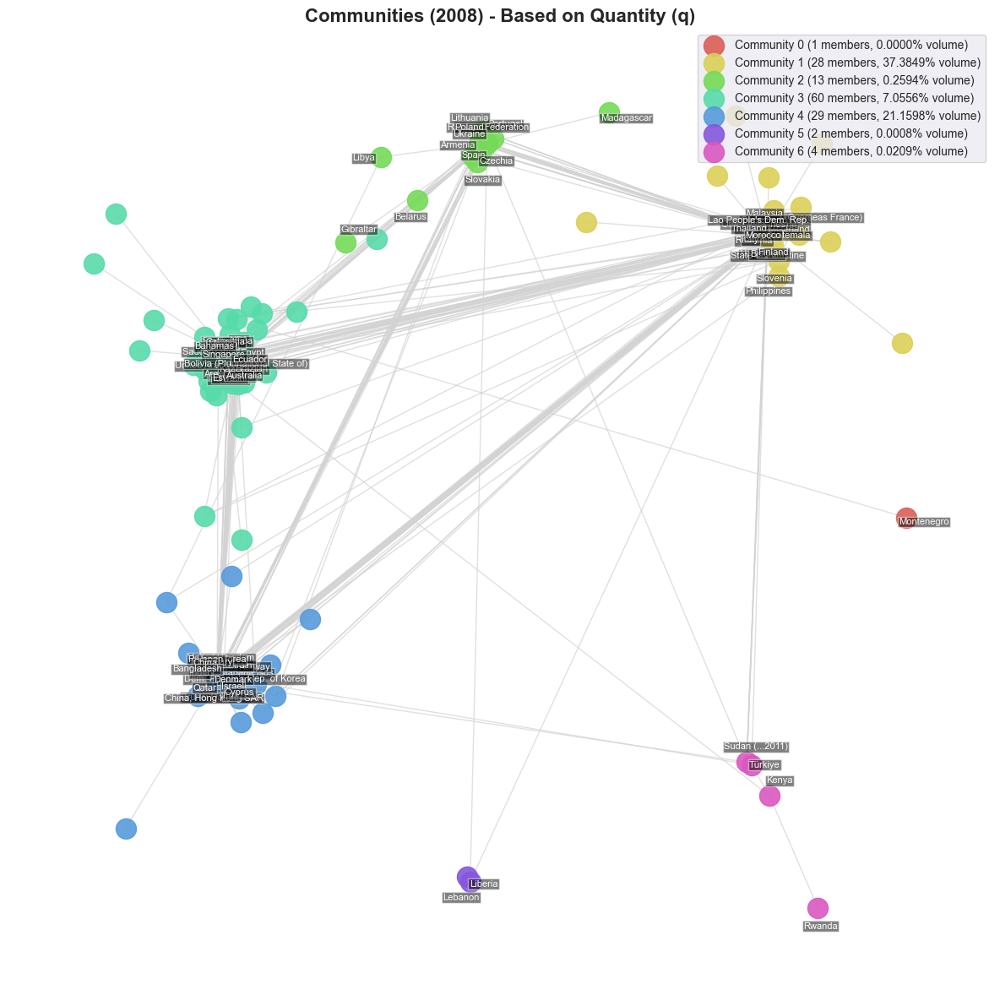

Top Countries by Community based on q:
Community 0:
  Montenegro
Community 1:
  Belgium | Jordan | Netherlands | France | Germany | Italy | Austria | Switzerland | Finland | State of Palestine | Malaysia | Thailand | Romania | Other Asia, nes | Guatemala | Morocco | Lao People's Dem. Rep. | Slovenia | Mayotte (Overseas France) | Philippines
Community 2:
  Ukraine | Spain | Russian Federation | Czechia | Poland | Portugal | Lithuania | Slovakia | Armenia | Belarus | Libya | Madagascar | Gibraltar
Community 3:
  USA | Canada | South Africa | Argentina | Mexico | United Arab Emirates | Australia | Saudi Arabia | Indonesia | Egypt | Brazil | Colombia | Singapore | Ecuador | Namibia | Kazakhstan | Peru | Eswatini | Bahamas | Bolivia (Plurinational State of)
Community 4:
  Israel | China | India | United Kingdom | Japan | Rep. of Korea | Qatar | Hungary | China, Hong Kong SAR | Sweden | Iran | N. Mariana Isds | Cyprus | Bahrain | Dem. People's Rep. of Korea | Norway | Denmark | Yemen | Brune

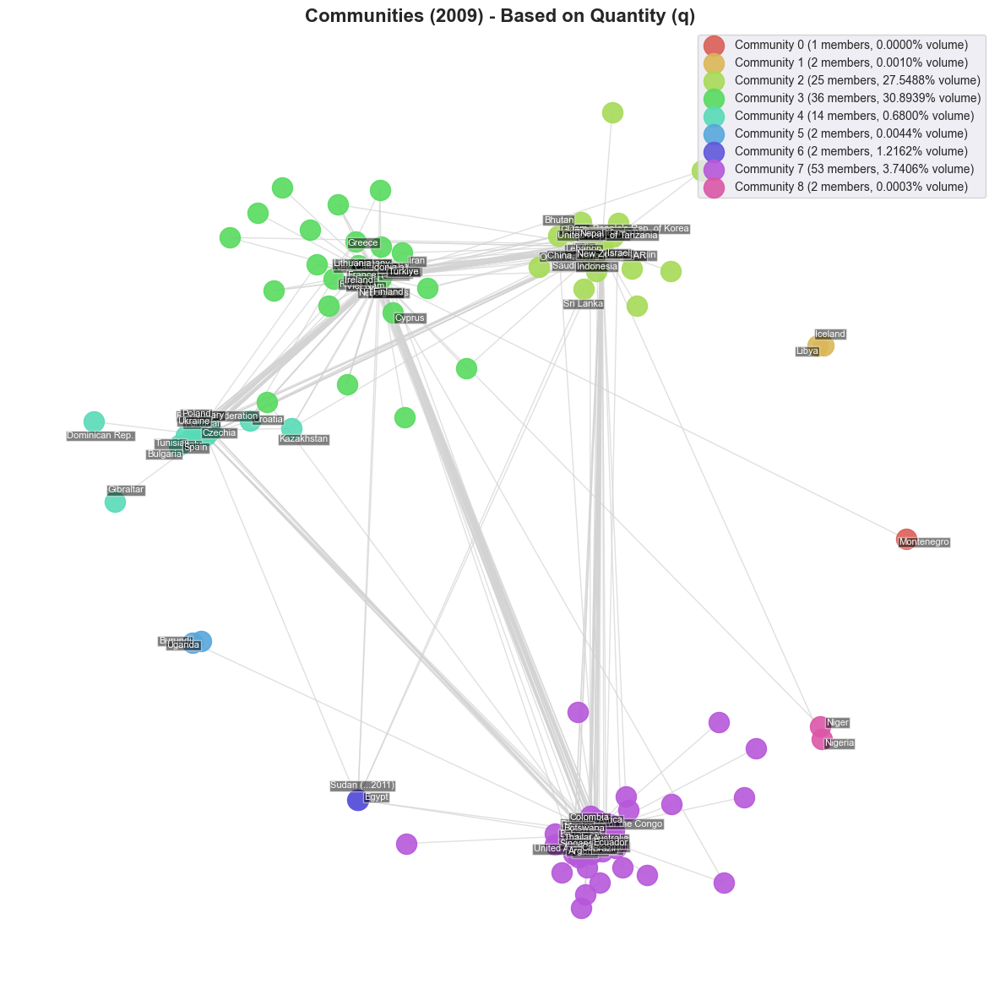

Top Countries by Community based on q:
Community 0:
  Montenegro
Community 1:
  Iceland | Libya
Community 2:
  Israel | China | United Kingdom | India | Japan | Rep. of Korea | Sweden | Indonesia | New Zealand | China, Hong Kong SAR | Dem. People's Rep. of Korea | Other Asia, nes | Lebanon | Saudi Arabia | United Rep. of Tanzania | Bhutan | Nepal | Bahrain | Ghana | Sri Lanka
Community 3:
  Belgium | France | Netherlands | Jordan | Finland | Germany | Switzerland | Austria | Romania | Yemen | Malaysia | New Caledonia | Guatemala | Türkiye | Viet Nam | Lithuania | Ireland | Iran | Greece | Cyprus
Community 4:
  Italy | Spain | Ukraine | Russian Federation | Hungary | Poland | Czechia | Portugal | Tunisia | Bulgaria | Croatia | Kazakhstan | Dominican Rep. | Gibraltar
Community 5:
  Burundi | Uganda
Community 6:
  Egypt | Sudan (...2011)
Community 7:
  USA | Canada | South Africa | Mexico | United Arab Emirates | Brazil | Botswana | Singapore | Eswatini | Dem. Rep. of the Congo | Malawi |

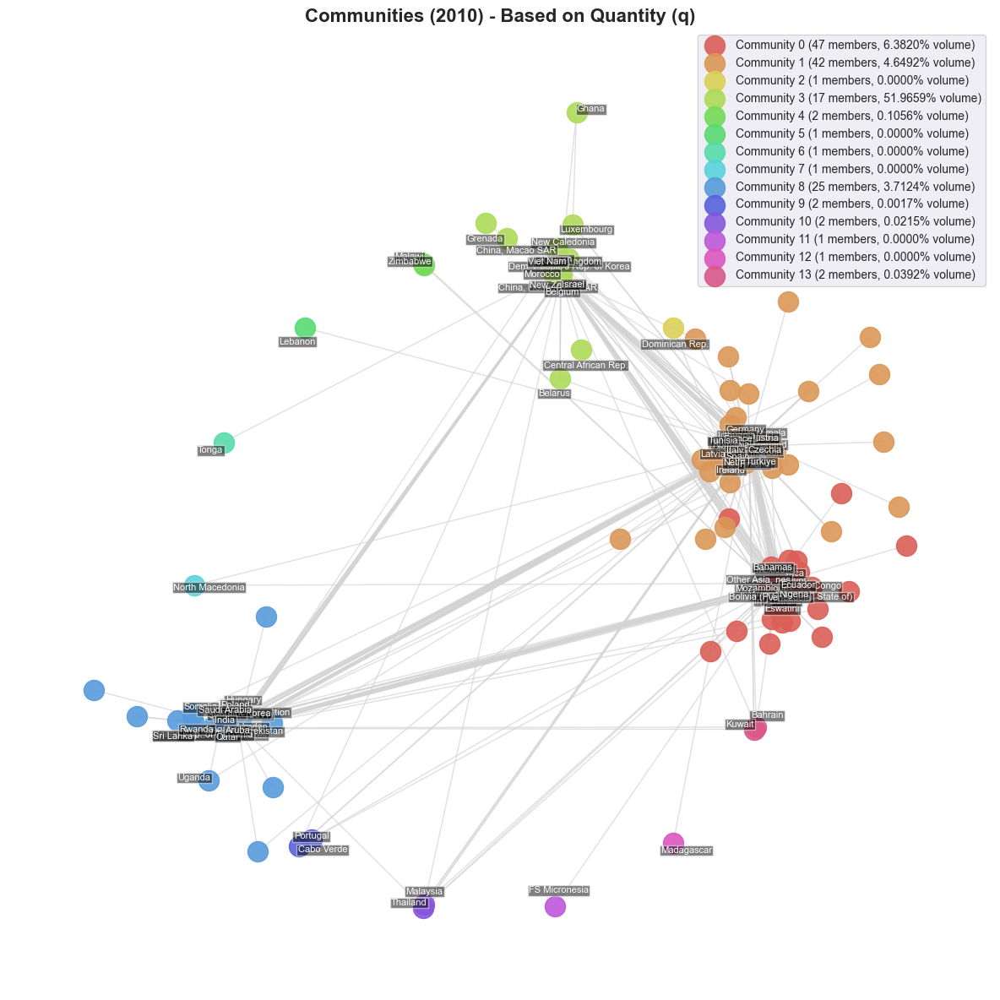

Top Countries by Community based on q:
Community 0:
  USA | Canada | Mexico | South Africa | Colombia | Oman | Eswatini | Brazil | Australia | Argentina | Egypt | Venezuela | Nigeria | Bolivia (Plurinational State of) | Mozambique | Other Asia, nes | Indonesia | Dem. Rep. of the Congo | Ecuador | Bahamas
Community 1:
  France | Netherlands | Italy | Spain | Germany | Austria | Sweden | Finland | Switzerland | Romania | Türkiye | Azerbaijan | Czechia | Lithuania | Guatemala | Tunisia | Ireland | Latvia | Namibia | Cameroon
Community 2:
  Dominican Rep.
Community 3:
  Israel | China | United Kingdom | Belgium | Japan | New Zealand | China, Hong Kong SAR | Dem. People's Rep. of Korea | Morocco | New Caledonia | Viet Nam | Luxembourg | China, Macao SAR | Central African Rep. | Grenada | Belarus | Ghana
Community 4:
  Malawi | Zimbabwe
Community 5:
  Lebanon
Community 6:
  Tonga
Community 7:
  North Macedonia
Community 8:
  Jordan | India | Ukraine | Rep. of Korea | United Arab Emirates | Q

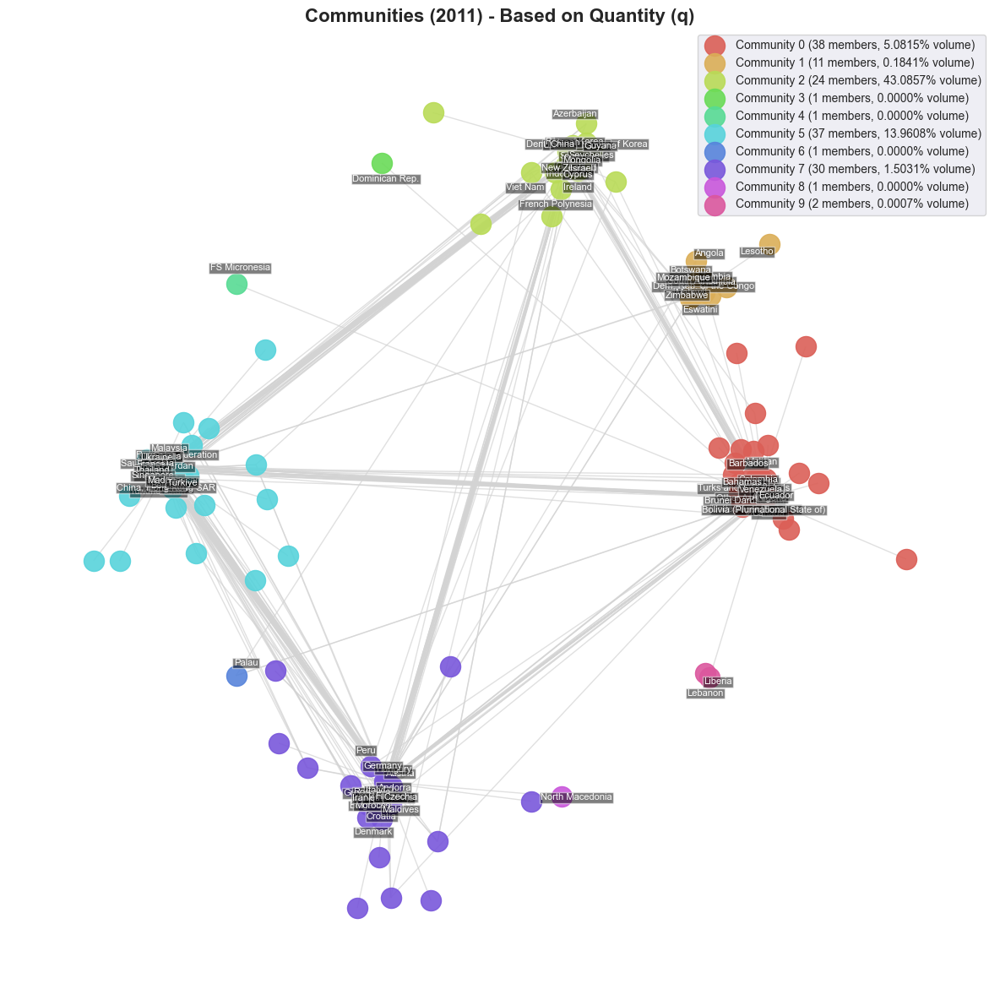

Top Countries by Community based on q:
Community 0:
  USA | Canada | United Arab Emirates | Mexico | Other Asia, nes | Argentina | Brazil | Colombia | Ecuador | Iraq | Brunei Darussalam | Nigeria | Bolivia (Plurinational State of) | Australia | Turks and Caicos Isds | Bahamas | Oman | Mali | Barbados | Venezuela
Community 1:
  South Africa | Dem. Rep. of the Congo | Zimbabwe | Malawi | Eswatini | Mozambique | Namibia | Botswana | Zambia | Angola | Lesotho
Community 2:
  Israel | China | United Kingdom | Japan | Indonesia | Switzerland | Rep. of Korea | Sweden | New Zealand | Cyprus | Dem. People's Rep. of Korea | Seychelles | Ireland | Egypt | Ghana | Guyana | Mongolia | French Polynesia | Azerbaijan | Viet Nam
Community 3:
  Dominican Rep.
Community 4:
  FS Micronesia
Community 5:
  Belgium | Jordan | France | India | Ukraine | Singapore | Russian Federation | Thailand | China, Hong Kong SAR | Poland | Malaysia | Saudi Arabia | Slovenia | Türkiye | Lithuania | Madagascar | Burundi | T

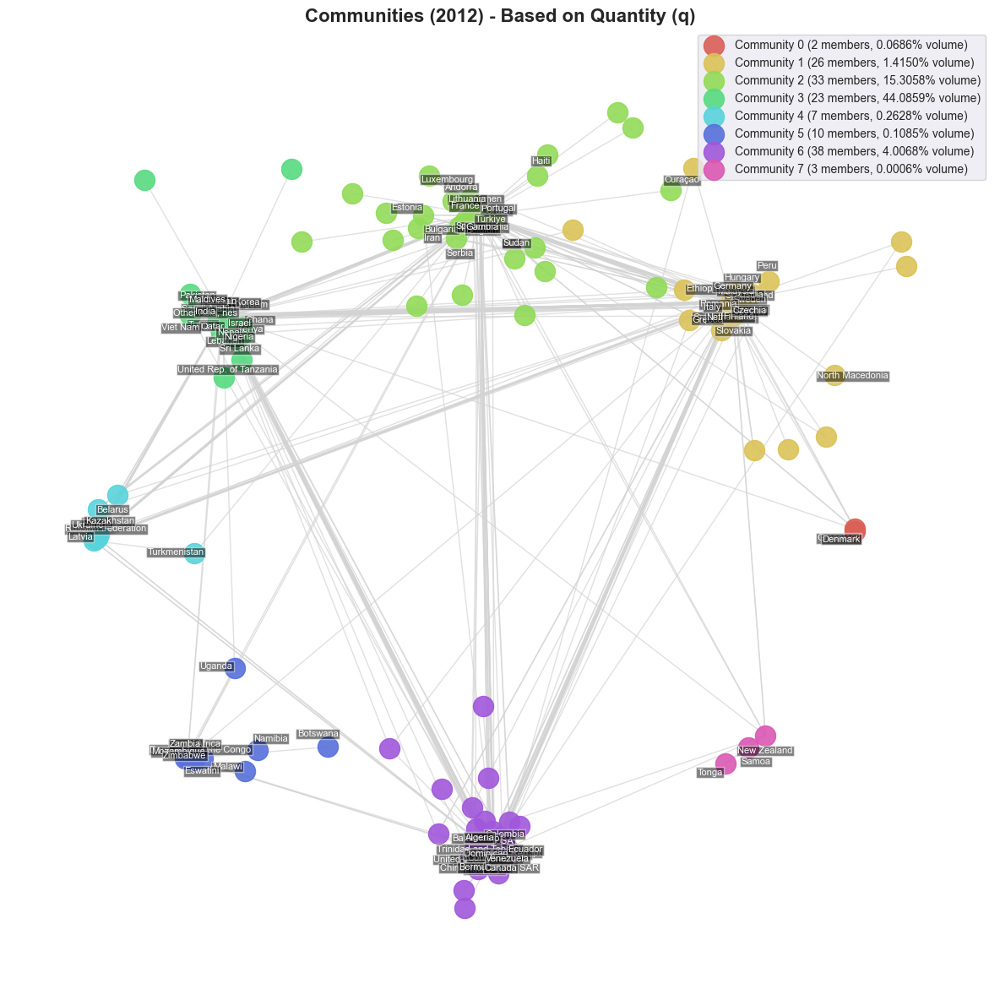

Top Countries by Community based on q:
Community 0:
  Denmark | Greenland
Community 1:
  Netherlands | Italy | Germany | Austria | Finland | Switzerland | Czechia | Malaysia | Romania | Sweden | Hungary | Norway | Slovakia | Slovenia | Greece | Peru | Croatia | Ethiopia | North Macedonia | Curaçao
Community 2:
  Jordan | France | Belgium | Spain | Australia | Portugal | Lithuania | Türkiye | Morocco | Gambia | Yemen | Bulgaria | Andorra | Serbia | Estonia | Iran | Mali | Sudan | Luxembourg | Haiti
Community 3:
  Israel | China | United Kingdom | India | Japan | Rep. of Korea | Qatar | Other Asia, nes | Saudi Arabia | Nepal | Tunisia | Lebanon | Pakistan | Nigeria | Ghana | Kenya | Sri Lanka | Viet Nam | Maldives | United Rep. of Tanzania
Community 4:
  Ukraine | Russian Federation | Poland | Latvia | Kazakhstan | Belarus | Turkmenistan
Community 5:
  South Africa | Dem. Rep. of the Congo | Eswatini | Mozambique | Zambia | Zimbabwe | Malawi | Namibia | Uganda | Botswana
Community 6:
  U

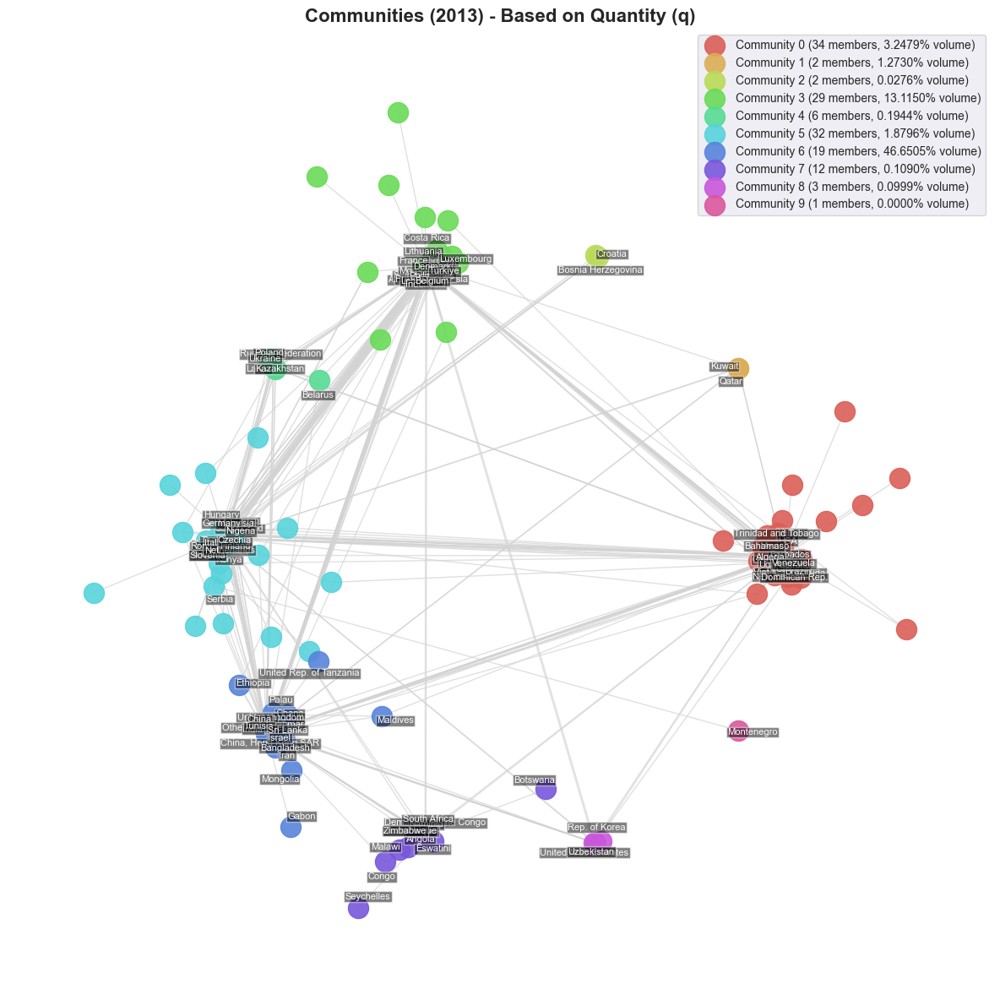

Top Countries by Community based on q:
Community 0:
  USA | Canada | Mexico | Venezuela | Argentina | Australia | Viet Nam | Brazil | Algeria | Trinidad and Tobago | New Zealand | Dominican Rep. | Bahamas | Uganda | Panama | Barbados | Bermuda | Colombia | Oman | Yemen
Community 1:
  Qatar | Kuwait
Community 2:
  Croatia | Bosnia Herzegovina
Community 3:
  Jordan | France | Belgium | Spain | Singapore | Iraq | Indonesia | Lebanon | Morocco | Egypt | Syria | Lithuania | Türkiye | Portugal | Afghanistan | French Polynesia | Philippines | Denmark | Costa Rica | Luxembourg
Community 4:
  Ukraine | Russian Federation | Poland | Latvia | Kazakhstan | Belarus
Community 5:
  Netherlands | Italy | Austria | Germany | Finland | Switzerland | Sweden | Bulgaria | Romania | Greece | Czechia | Thailand | Malaysia | Norway | Hungary | Nigeria | Slovenia | Kenya | Peru | Serbia
Community 6:
  Israel | China | United Kingdom | India | Japan | Other Asia, nes | China, Hong Kong SAR | Bangladesh | Tunisi

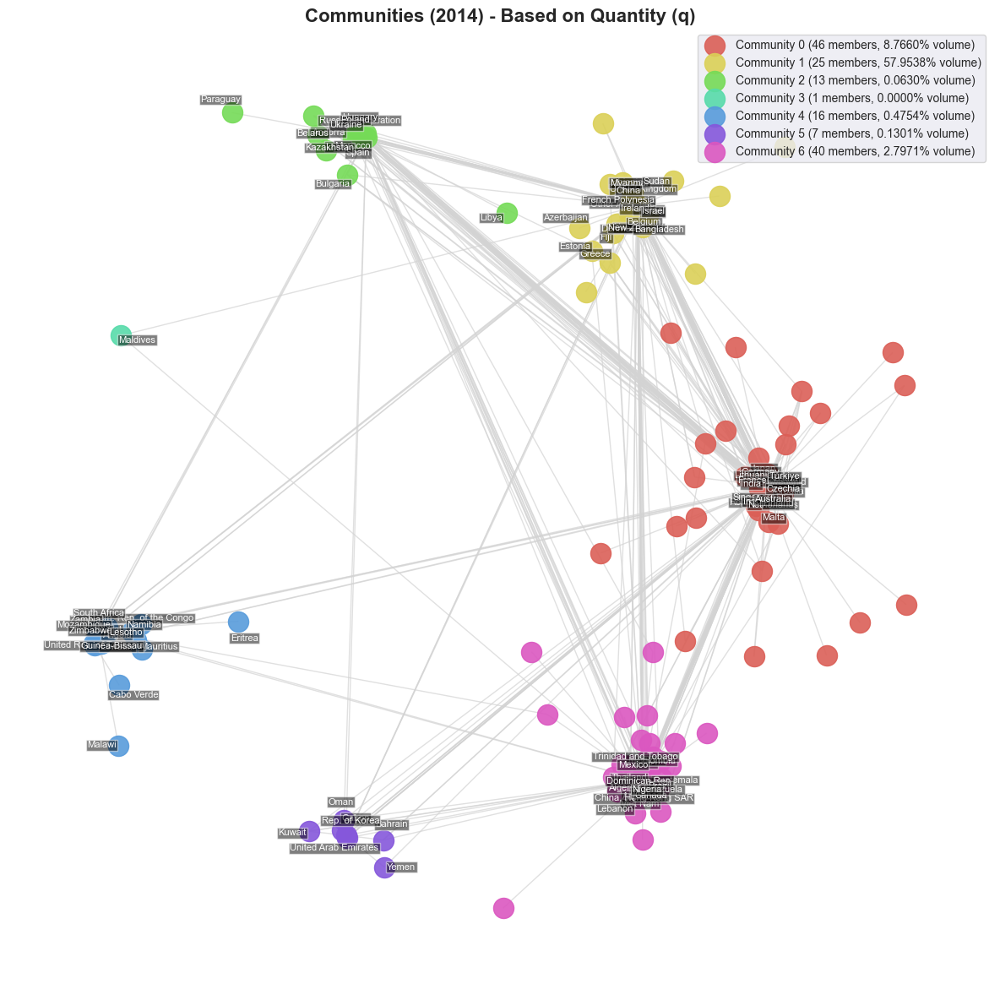

Top Countries by Community based on q:
Community 0:
  Jordan | France | India | Netherlands | Japan | Singapore | Germany | Italy | Finland | Austria | Switzerland | Indonesia | Sweden | Czechia | Lithuania | Romania | Australia | Croatia | Türkiye | Malta
Community 1:
  Israel | China | Belgium | United Kingdom | Other Asia, nes | New Zealand | Myanmar | Denmark | Ireland | Bangladesh | Guinea | Palau | Fiji | French Polynesia | Norway | Ethiopia | Sudan | Greece | Estonia | Azerbaijan
Community 2:
  Spain | Ukraine | Russian Federation | Poland | Morocco | Hungary | Latvia | Bulgaria | Kazakhstan | Andorra | Belarus | Paraguay | Libya
Community 3:
  Maldives
Community 4:
  South Africa | Zambia | Portugal | Guinea-Bissau | Mozambique | United Rep. of Tanzania | Angola | Eswatini | Zimbabwe | Dem. Rep. of the Congo | Namibia | Lesotho | Mauritius | Cabo Verde | Malawi | Eritrea
Community 5:
  Rep. of Korea | United Arab Emirates | Gabon | Oman | Bahrain | Kuwait | Yemen
Community 6:
 

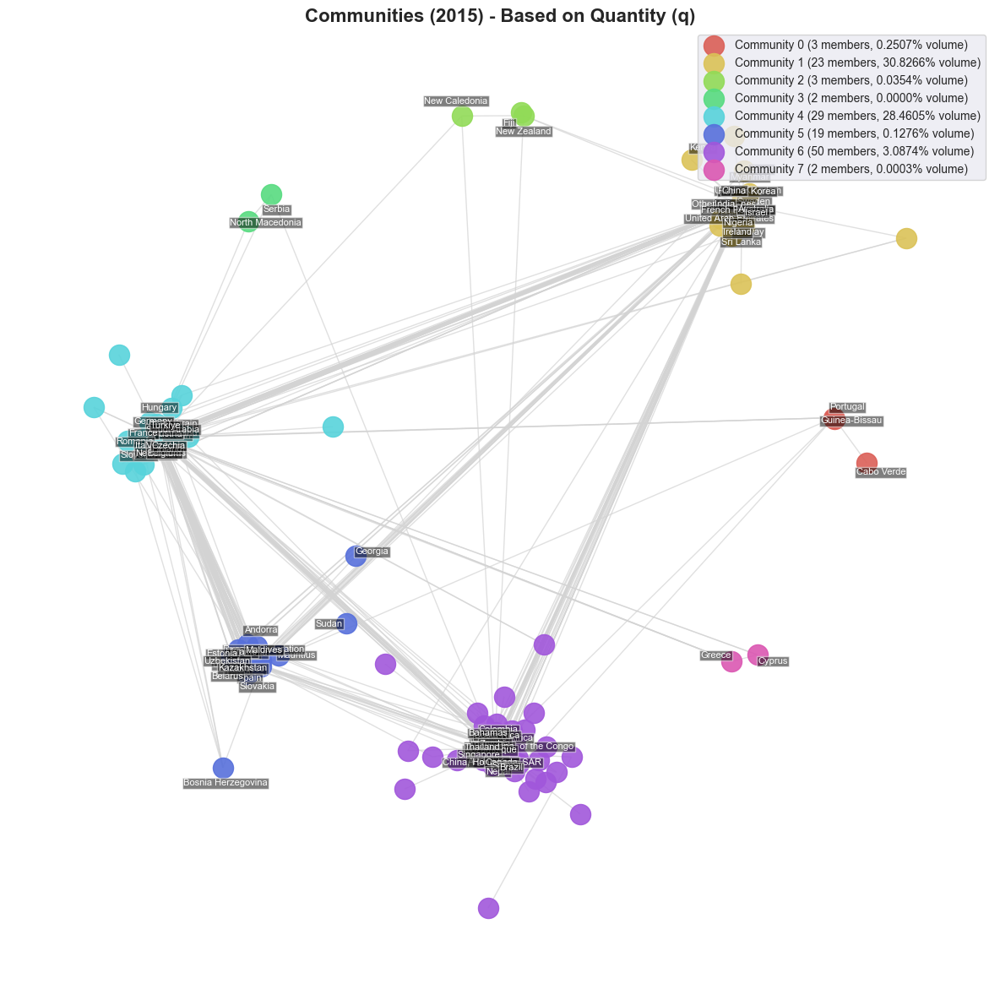

Top Countries by Community based on q:
Community 0:
  Portugal | Guinea-Bissau | Cabo Verde
Community 1:
  Israel | China | India | United Kingdom | Other Asia, nes | Rep. of Korea | United Arab Emirates | Sweden | Australia | Pakistan | French Polynesia | Gabon | Ireland | Myanmar | Sri Lanka | Nigeria | Palau | Norway | Egypt | Kenya
Community 2:
  New Zealand | Fiji | New Caledonia
Community 3:
  Serbia | North Macedonia
Community 4:
  Belgium | Jordan | France | Netherlands | Japan | Italy | Germany | Iraq | Switzerland | Indonesia | Finland | Czechia | Romania | Austria | Bahrain | Hungary | Viet Nam | Slovenia | Türkiye | Saudi Arabia
Community 5:
  Spain | Russian Federation | Ukraine | Lithuania | Latvia | Poland | Morocco | Slovakia | Bulgaria | Mauritius | Andorra | Uzbekistan | Kazakhstan | Belarus | Estonia | Maldives | Sudan | Bosnia Herzegovina | Georgia
Community 6:
  USA | Singapore | Canada | Mexico | South Africa | China, Hong Kong SAR | Argentina | Mozambique | Malay

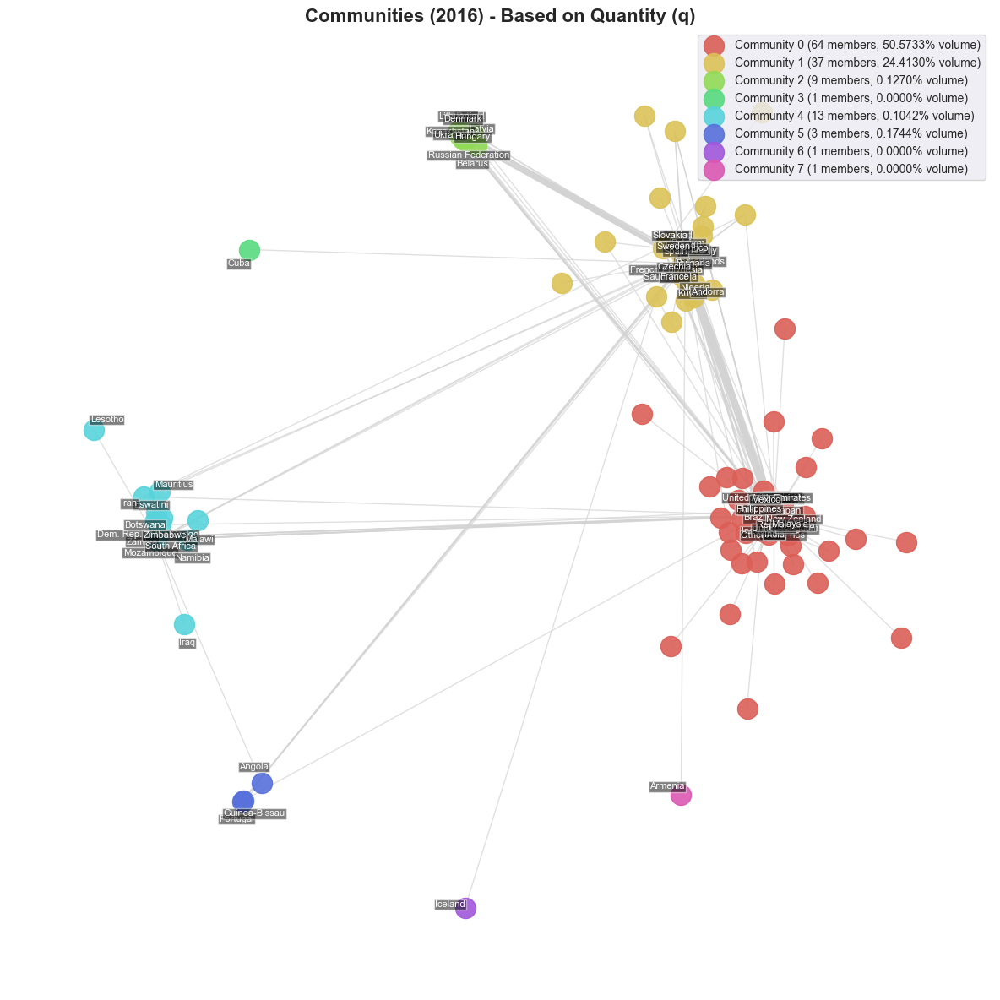

Top Countries by Community based on q:
Community 0:
  Israel | China | USA | India | United Kingdom | Singapore | Other Asia, nes | Canada | Japan | Rep. of Korea | Switzerland | Mexico | United Arab Emirates | Myanmar | New Zealand | Brazil | Malaysia | Australia | Indonesia | Philippines
Community 1:
  Belgium | Jordan | France | Netherlands | Germany | Italy | Finland | Spain | Saudi Arabia | Czechia | Romania | Sweden | French Polynesia | Slovakia | Morocco | Nigeria | Kuwait | Bulgaria | Andorra | Thailand
Community 2:
  Russian Federation | Lithuania | Kazakhstan | Ukraine | Hungary | Latvia | Poland | Denmark | Belarus
Community 3:
  Cuba
Community 4:
  South Africa | Zambia | Mozambique | Dem. Rep. of the Congo | Zimbabwe | Eswatini | Botswana | Namibia | Iran | Mauritius | Malawi | Iraq | Lesotho
Community 5:
  Portugal | Guinea-Bissau | Angola
Community 6:
  Iceland
Community 7:
  Armenia


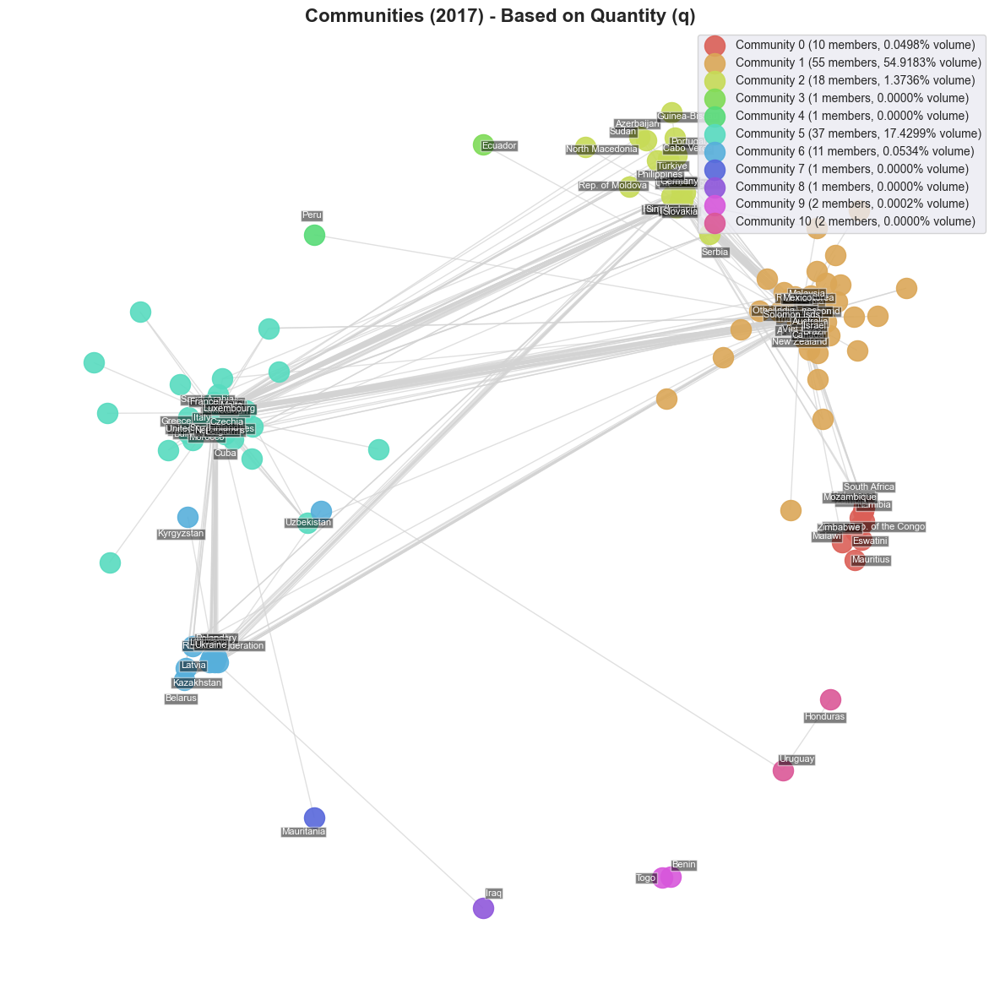

Top Countries by Community based on q:
Community 0:
  South Africa | Mozambique | Botswana | Zambia | Namibia | Eswatini | Zimbabwe | Dem. Rep. of the Congo | Mauritius | Malawi
Community 1:
  Israel | China | India | USA | Other Asia, nes | Canada | Rep. of Korea | Switzerland | Mexico | Brazil | Gabon | New Zealand | Australia | Malaysia | Argentina | Belize | Angola | Viet Nam | Thailand | Solomon Isds
Community 2:
  United Kingdom | Singapore | Japan | Germany | Romania | Indonesia | Ireland | Slovakia | Portugal | Türkiye | Cabo Verde | Azerbaijan | Sudan | Philippines | Serbia | Guinea-Bissau | Rep. of Moldova | North Macedonia
Community 3:
  Ecuador
Community 4:
  Peru
Community 5:
  Jordan | Belgium | France | Netherlands | Saudi Arabia | Finland | Italy | Spain | Austria | Czechia | Sweden | United Arab Emirates | Luxembourg | Pakistan | Morocco | Malta | Bulgaria | Tunisia | Cuba | Greece
Community 6:
  Lithuania | Russian Federation | Ukraine | Latvia | Poland | Hungary | No

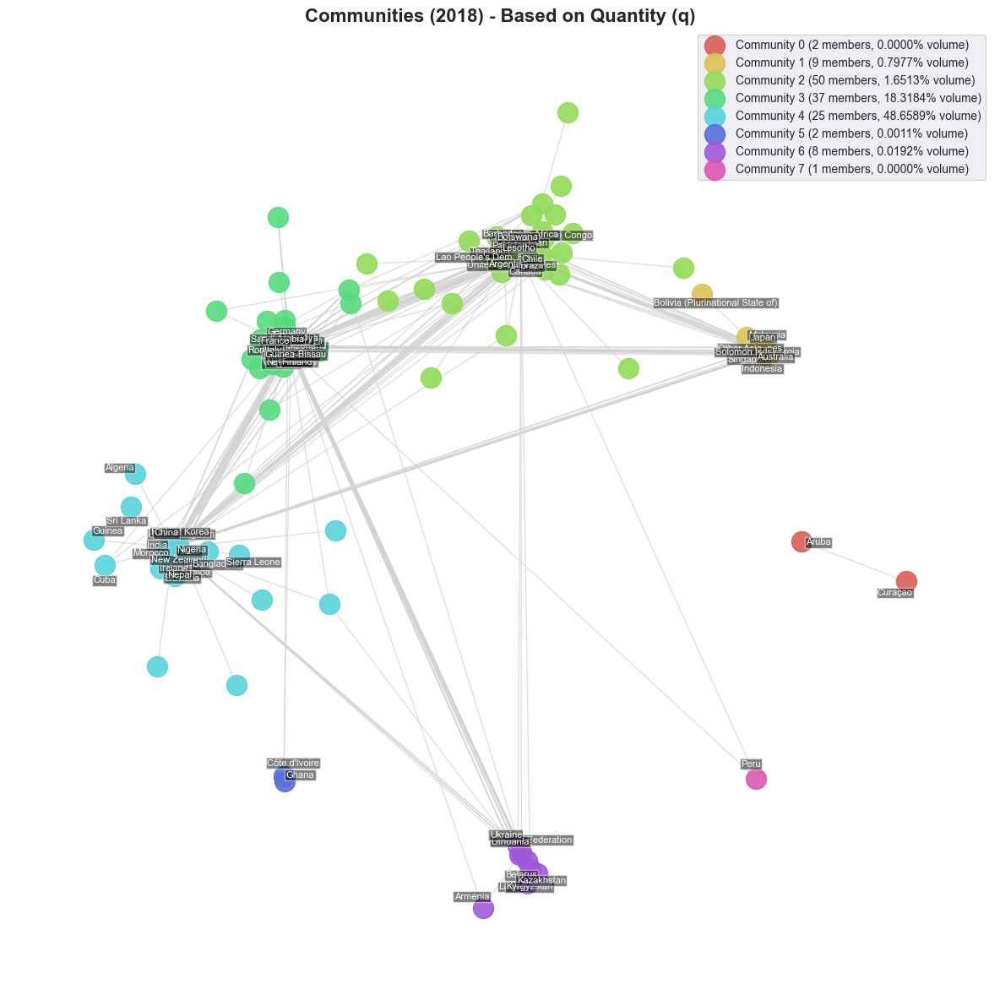

Top Countries by Community based on q:
Community 0:
  Aruba | Curaçao
Community 1:
  Japan | Singapore | Georgia | Malaysia | Other Asia, nes | Australia | Indonesia | Solomon Isds | Bolivia (Plurinational State of)
Community 2:
  USA | Canada | Mexico | Brazil | South Africa | United Arab Emirates | Botswana | Pakistan | Zambia | Argentina | Chile | Qatar | Thailand | Lao People's Dem. Rep. | Lesotho | Kuwait | Dem. Rep. of the Congo | Oman | Colombia | Barbados
Community 3:
  Jordan | Belgium | France | Saudi Arabia | Netherlands | Germany | Italy | Austria | Spain | Finland | Sweden | Portugal | Czechia | Viet Nam | Guinea-Bissau | Switzerland | Hungary | Norway | Romania | Poland
Community 4:
  Israel | China | India | United Kingdom | Rep. of Korea | Nigeria | New Zealand | Ireland | Morocco | Nepal | Slovakia | Samoa | Egypt | Kenya | Bangladesh | Sri Lanka | Sierra Leone | Cuba | Guinea | Algeria
Community 5:
  Côte d'Ivoire | Ghana
Community 6:
  Ukraine | Russian Federation | 

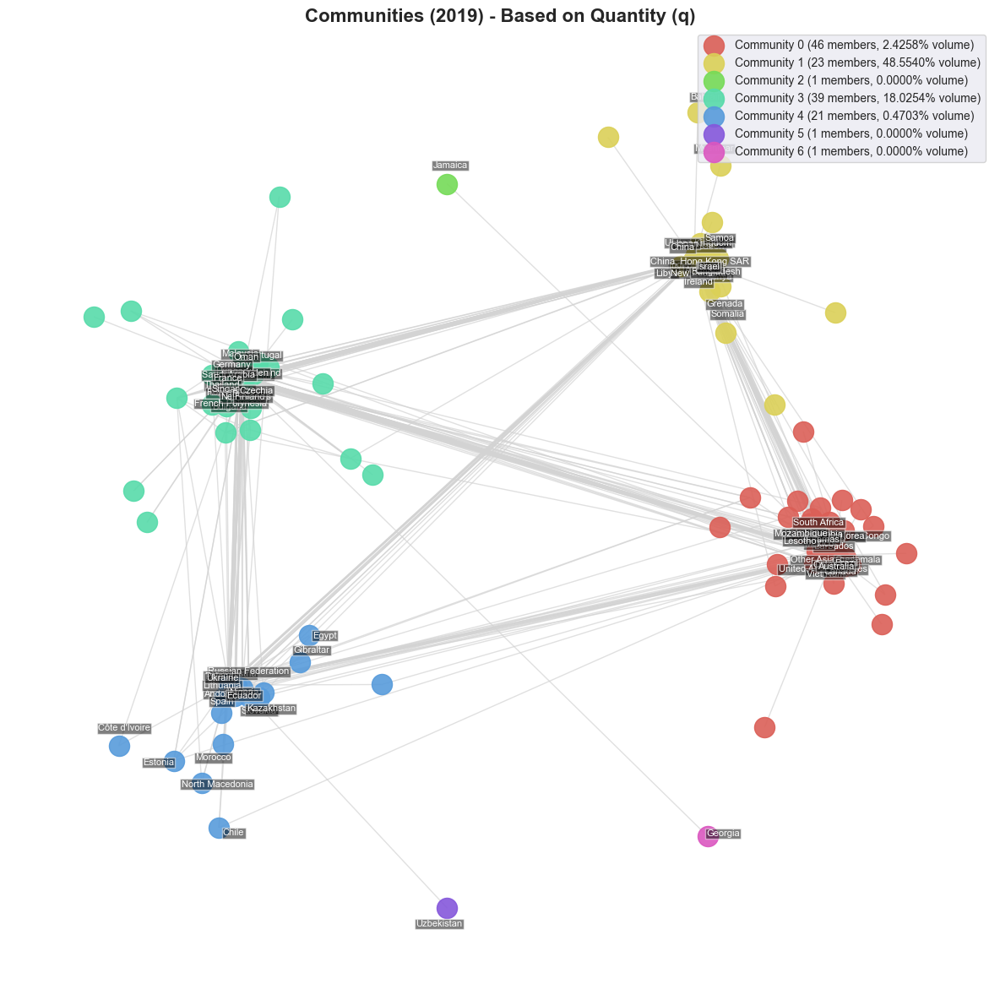

Top Countries by Community based on q:
Community 0:
  USA | Canada | Rep. of Korea | United Arab Emirates | Brazil | Mexico | Other Asia, nes | South Africa | Zambia | Viet Nam | Colombia | Botswana | Qatar | Dem. Rep. of the Congo | Mozambique | Bahamas | Australia | Barbados | Guatemala | Lesotho
Community 1:
  China | Israel | India | United Kingdom | Japan | Ireland | New Zealand | Gabon | Nepal | Bangladesh | Libya | Argentina | China, Hong Kong SAR | Kenya | Iraq | Grenada | Samoa | Somalia | Myanmar | Bahrain
Community 2:
  Jamaica
Community 3:
  Jordan | Belgium | France | Singapore | Saudi Arabia | Netherlands | Germany | Italy | Switzerland | Finland | Czechia | Malaysia | Sweden | Thailand | Romania | Hungary | Portugal | Oman | French Polynesia | Bulgaria
Community 4:
  Spain | Nigeria | Austria | Poland | Ukraine | Ecuador | Russian Federation | Lithuania | Ghana | Slovakia | Kazakhstan | Belarus | Andorra | Morocco | Gibraltar | Estonia | North Macedonia | Egypt | Côte d'

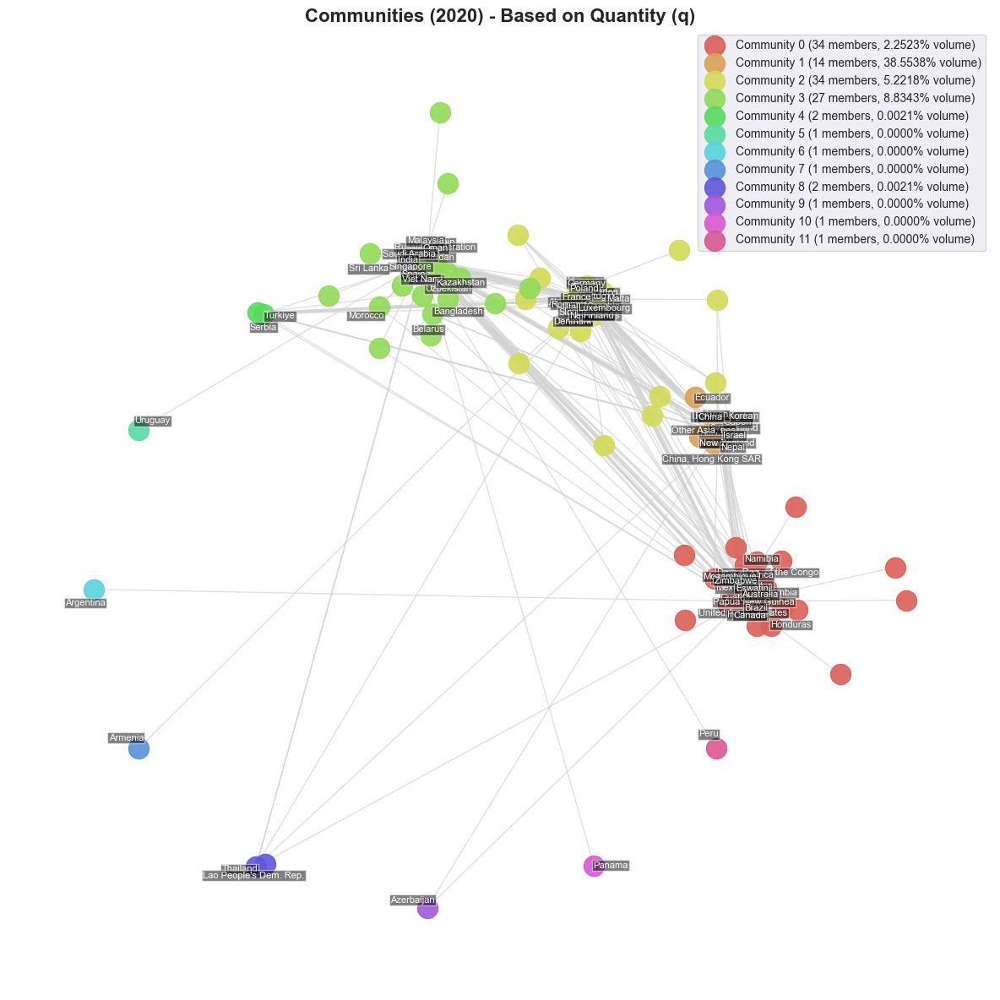

Top Countries by Community based on q:
Community 0:
  USA | Canada | Mexico | Brazil | South Africa | Australia | Botswana | Zambia | Papua New Guinea | Indonesia | United Arab Emirates | Zimbabwe | Mozambique | Guatemala | Dem. Rep. of the Congo | Eswatini | Colombia | Barbados | Honduras | Namibia
Community 1:
  Israel | China | Japan | United Kingdom | Rep. of Korea | Other Asia, nes | Switzerland | Gabon | Ireland | Nepal | New Zealand | China, Hong Kong SAR | Norway | Ecuador
Community 2:
  Belgium | France | Netherlands | Germany | Italy | Finland | Poland | Czechia | Sweden | Romania | Luxembourg | Hungary | Portugal | Denmark | Slovenia | Croatia | Algeria | Malta | Latvia | Bulgaria
Community 3:
  Jordan | India | Saudi Arabia | Singapore | Spain | Malaysia | Russian Federation | Ukraine | Viet Nam | Bahrain | Lithuania | Oman | Kazakhstan | Kenya | Andorra | Uzbekistan | Bangladesh | Sri Lanka | Belarus | Morocco
Community 4:
  Türkiye | Serbia
Community 5:
  Uruguay
Communit

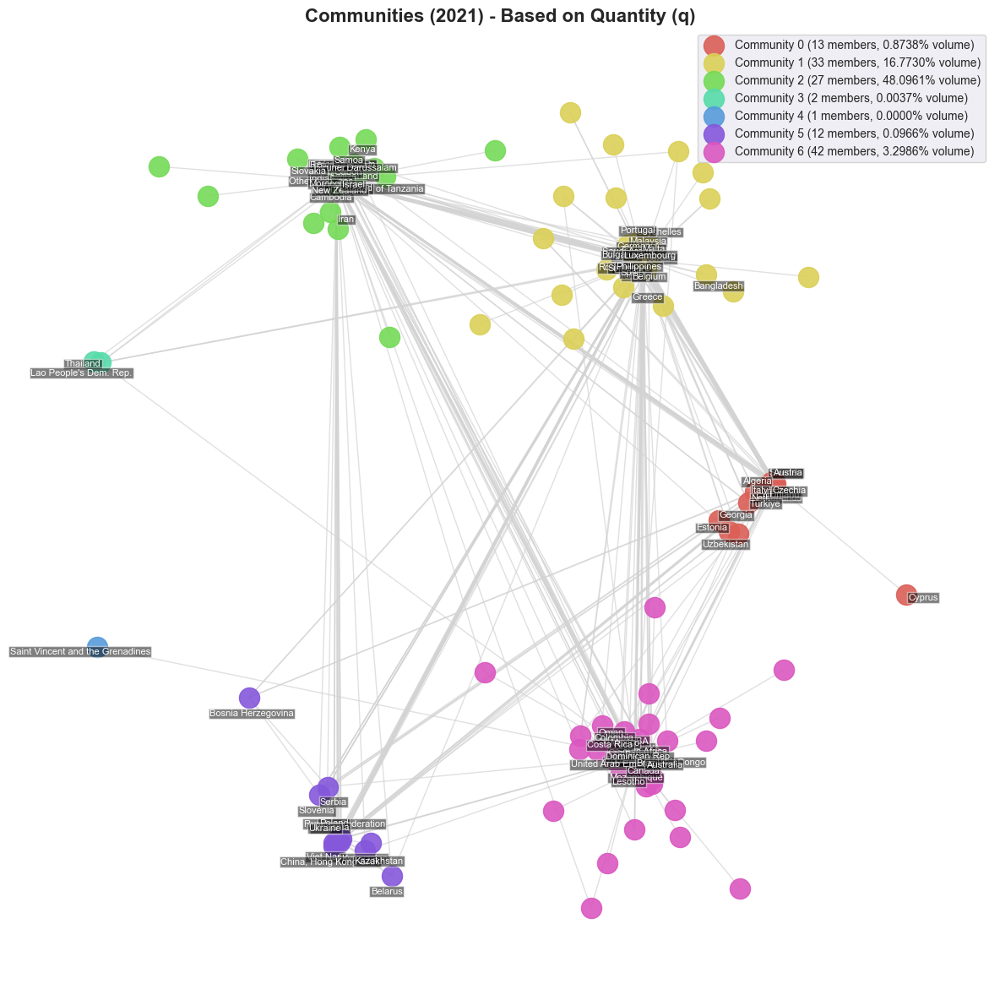

Top Countries by Community based on q:
Community 0:
  Netherlands | Finland | Italy | Austria | Sweden | Czechia | Algeria | Croatia | Türkiye | Georgia | Uzbekistan | Estonia | Cyprus
Community 1:
  Jordan | Belgium | France | Singapore | Saudi Arabia | Germany | Spain | Malaysia | Hungary | Romania | Philippines | Luxembourg | Bulgaria | Seychelles | Malta | Portugal | Iceland | Niger | Greece | Bangladesh
Community 2:
  China | Israel | India | Japan | United Kingdom | Rep. of Korea | Switzerland | Other Asia, nes | Gabon | Cambodia | New Zealand | Morocco | Angola | Ireland | Kenya | Samoa | Iran | Brunei Darussalam | Slovakia | United Rep. of Tanzania
Community 3:
  Lao People's Dem. Rep. | Thailand
Community 4:
  Saint Vincent and the Grenadines
Community 5:
  Viet Nam | Russian Federation | Ukraine | China, Hong Kong SAR | Lithuania | Poland | Slovenia | Kazakhstan | Serbia | Kyrgyzstan | Belarus | Bosnia Herzegovina
Community 6:
  USA | Canada | Mexico | South Africa | Brazil |

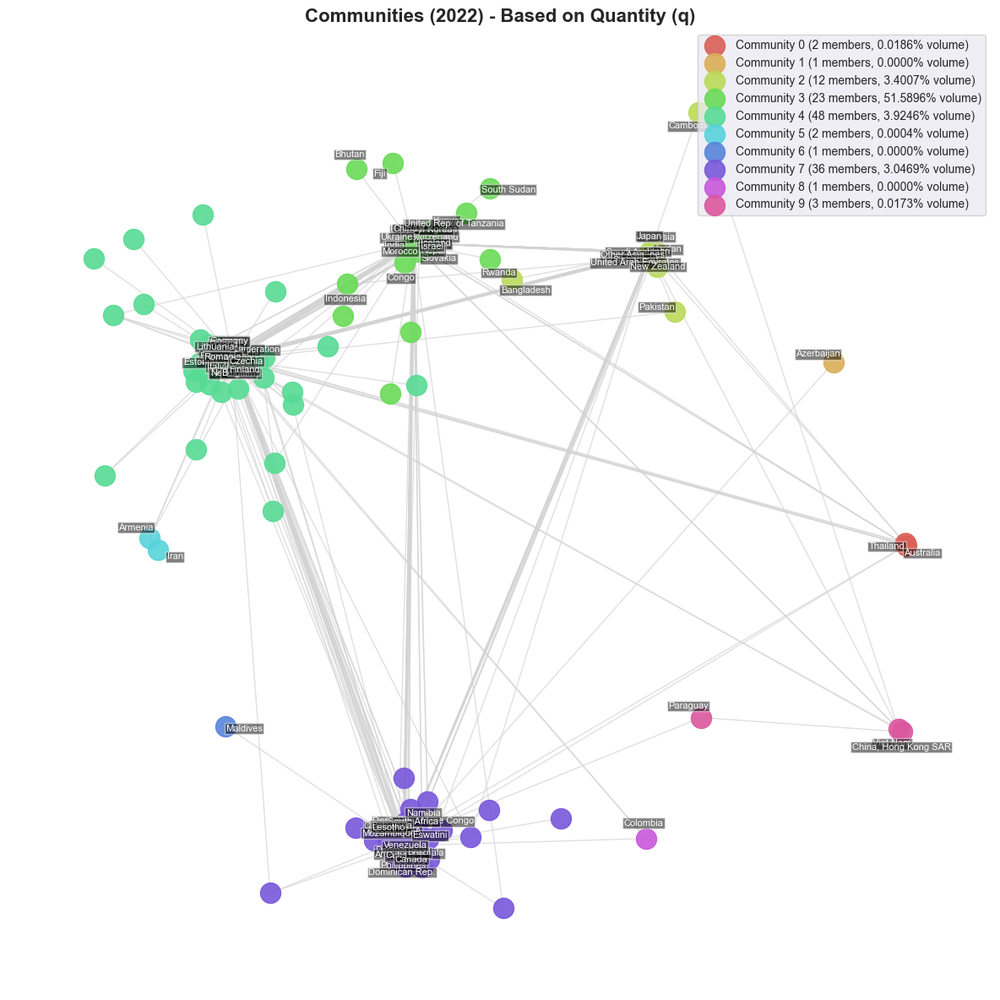

Top Countries by Community based on q:
Community 0:
  Australia | Thailand
Community 1:
  Azerbaijan
Community 2:
  Jordan | Japan | Singapore | United Arab Emirates | Malaysia | Other Asia, nes | New Zealand | Saudi Arabia | Oman | Pakistan | Bangladesh | Cambodia
Community 3:
  China | Israel | India | United Kingdom | Rep. of Korea | Morocco | Ethiopia | Switzerland | Nepal | Ukraine | Iceland | Slovakia | Kenya | Congo | United Rep. of Tanzania | Rwanda | South Sudan | Indonesia | Fiji | Bhutan
Community 4:
  Belgium | France | Netherlands | Spain | Finland | Italy | Germany | Poland | Austria | Czechia | Russian Federation | Sweden | Algeria | Senegal | Hungary | Lithuania | Romania | Estonia | Portugal | Croatia
Community 5:
  Armenia | Iran
Community 6:
  Maldives
Community 7:
  USA | Canada | Mexico | South Africa | Brazil | Mozambique | Zambia | Botswana | Philippines | Argentina | Denmark | Dem. Rep. of the Congo | Costa Rica | Cuba | Guatemala | Dominican Rep. | Namibia | Ve

In [30]:
import polars as pl
import pandas as pd
import numpy as np
import networkx as nx
from community import community_louvain
import matplotlib.pyplot as plt
import seaborn as sns
import math

##############################################
# Data Selection
##############################################
df_fluorine = df.filter(pl.col("k") == 280130).to_pandas()
df_fluorine['t'] = df_fluorine['t'].astype(int)

years = sorted(df_fluorine['t'].unique())

##############################################
# Construction of Yearly Graphs
##############################################
yearly_graphs = {}
for y in years:
    df_year = df_fluorine[df_fluorine['t'] == y]
    df_agg = df_year.groupby(['export_country','import_country'], as_index=False)['q'].sum()

    G = nx.Graph()
    for _, row in df_agg.iterrows():
        exporter = row['export_country']
        importer = row['import_country']
        quantity = row['q']
        if exporter != importer:
            if G.has_edge(exporter, importer):
                G[exporter][importer]['weight'] += quantity
            else:
                G.add_edge(exporter, importer, weight=quantity)
    yearly_graphs[y] = G

##############################################
# Community Visualization
##############################################
sns.set_theme(style='darkgrid')

for y in years:
    G = yearly_graphs[y]
    if G.number_of_nodes() == 0:
        print(f"Year {y}: No nodes to plot.")
        continue

    # Community Detection
    if G.number_of_edges() > 0:
        partition = community_louvain.best_partition(G, weight='weight')
    else:
        partition = {n:0 for n in G.nodes()}

    communities = {}
    for n, c in partition.items():
        communities.setdefault(c, []).append(n)

    # Computation of Node Strenght based on the Volume "q"
    node_strengths = {}
    for n in G.nodes():
        strength = sum(d['weight'] for _,_,d in G.edges(n, data=True))
        node_strengths[n] = strength

    # Selection of Top Nodes per Community (Annotation and Summary Stats)
    top_per_community = {}
    top_n_per_comm = 20
    for c, nodes in communities.items():
        nodes_strength = [(n, node_strengths[n]) for n in nodes]
        nodes_strength.sort(key=lambda x:x[1], reverse=True)
        top_nodes_c = [x[0] for x in nodes_strength[:top_n_per_comm]]
        top_per_community[c] = top_nodes_c

    top_nodes = set()
    for c in top_per_community:
        top_nodes.update(top_per_community[c])

    pos = nx.spring_layout(G, seed=42, k=0.15, iterations=100)

    num_com = len(communities)
    radius = 2.0
    angles = np.linspace(0, 2*math.pi, num_com, endpoint=False)
    offsets = [(radius*math.cos(a), radius*math.sin(a)) for a in angles]

    sorted_communities = sorted(communities.keys())
    palette = sns.color_palette("hls", num_com)
    community_colors = {}
    for i, c in enumerate(sorted_communities):
        community_colors[c] = palette[i]

    for i, c in enumerate(sorted_communities):
        nodes = communities[c]
        cx = np.mean([pos[n][0] for n in nodes])
        cy = np.mean([pos[n][1] for n in nodes])
        ox, oy = offsets[i]
        for n in nodes:
            pos[n] = (pos[n][0] - cx + ox, pos[n][1] - cy + oy)

    plt.figure(figsize=(12,12))
    plt.title(f"Communities ({y}) - Based on Quantity (q)", fontsize=16, fontweight='bold')

    nx.draw_networkx_edges(G, pos, edge_color='lightgray', alpha=0.7)

    # Computation of Community Shares of the Volume
    total_volume = sum(d['weight'] for _,_,d in G.edges(data=True))
    community_volumes = {}
    for c in sorted_communities:
        com_nodes = set(communities[c])
        com_volume = sum(d['weight'] for (u,v,d) in G.edges(data=True) 
                         if u in com_nodes and v in com_nodes)
        community_volumes[c] = com_volume

    handles = []
    labels = []
    for c in sorted_communities:
        nodes = communities[c]
        scatter = nx.draw_networkx_nodes(G, pos, nodelist=nodes,
                                         node_color=[community_colors[c]],
                                         node_size=300, alpha=0.9)
        share = (community_volumes[c] / total_volume)*100 if total_volume > 0 else 0.0
        community_label = f"Community {c} ({len(nodes)} members, {share:.4f}% volume)"
        handles.append(scatter)
        labels.append(community_label)

    label_positions = {}
    top_nodes = list(top_nodes)
    for i, n in enumerate(top_nodes):
        x, y = pos[n]
        angle = 2*math.pi*(i/len(top_nodes))
        offset_dist = 0.10
        dx = offset_dist*math.cos(angle)
        dy = offset_dist*math.sin(angle)
        label_positions[n] = (x+dx, y+dy)

    nx.draw_networkx_labels(G, label_positions,
                            labels={n:n for n in top_nodes},
                            font_size=8, font_color='white',
                            bbox=dict(facecolor='black', alpha=0.5, pad=1))

    plt.axis('off')
    plt.legend(handles, labels, fontsize=10, loc='upper right', frameon=True)
    plt.tight_layout()
    plt.show()

    print("Top Countries by Community based on q:")
    for c in sorted_communities:
        print(f"Community {c}:\n  {' | '.join(top_per_community[c])}")
